# 2026-08-30 Paper II Q4: plane-gradient SF direction and coarse VIVA alignment

**Fit the first-order spatial gradient of surviving-SF residuals, then ask whether
its direction is consistent with H I stripping geometry.** 

The primary estimator is $X=X_0+aE+bN$, with projected east/north coordinates
in kpc. Its amplitude is $g=\sqrt{a^2+b^2}$ and its directed sky PA is
$\theta=\operatorname{atan2}(a,b)\bmod360$ degrees. The **local residual gradient**
sets $\theta_{\rm SF}$; environmental and standardized gradients are correlated
cross-checks. Hemisphere medians and enhanced fractions are evaluated at that
continuous angle, without rounding or searching for a better hemisphere split.

Q3's sample, masks, reference and native pixels are unchanged. Original
MUSE-only five-panel maps remain, followed by gradient diagnostics, hemisphere
robustness curves, fixed VIVA comparisons and close-to-peak annotated maps.
No arbitrary strip width, higher-order surface, deprojected wind, or naive
independent-pixel error bar is introduced. This retrospective study is descriptive,
not a preregistered experiment or causal test. External saves are off.

## 1. Unchanged Q3 selection and explicit Q4 controls

In [1]:
from pathlib import Path

PROJECT_ROOT = Path.cwd().resolve()
DATA_ROOT = PROJECT_ROOT / "v3tk_v7.6.8"
CATALOG_PATH = PROJECT_ROOT / "mauve_master_wiki_newclass.fits"
GEOMETRY_PATH = PROJECT_ROOT / "MAUVE_effective_radii.csv"
GALAXY_COLOR_PATH = PROJECT_ROOT / "MAUVE_galaxy_colors.dat"
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "paper2_Q4_gradient_scan_VIVA"
FIGURE_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "tables"
DIAGNOSTIC_DIR = OUTPUT_DIR / "diagnostics"

MASS_FILE_PATTERN = "{galid}_spatial_binning_maps_further.fits"
SFR_FILE_PATTERNS = (
    "{galid}_gas_bin_maps_further.fits",
    "{galid}_gas_BIN_maps_further.fits",
)
EW_FILE_PATTERNS = (
    "{galid}_proxy_EW_maps_further.fits",
    "{galid}_proxy_EW_maps.fits",
)
MASK_FILE_PATTERN = "{galid}_mask.fits"

MASS_HDU = "LOGMASS_SURFACE_DENSITY"
BIN_HDU_MASS = "BINID"
BIN_HDU_GAS = "BIN_ID"
SFR_HDU_PRIMARY = "LOGSFR_SURFACE_DENSITY_HII"
SFR_HDU_ROBUST = "LOGSFR_SURFACE_DENSITY_SF"
EW_HDU = "PROXY_EWHA"
EW_HA_MIN = 6.0
HALPHA_SIGMA_OBS_HDU = "HA6562_SIGMA"
HALPHA_SIGMA_CORR_HDU = "HA6562_SIGMA_CORR"
HALPHA_SIGMA_MAX = 45.0
MASK_TABLE_HDU = "MASKFILE"
MASK_COLUMN = "MASK"               # live nGIST convention: 0 usable, 1 masked

N_SIGMA_BINS = 12
SIGMA_RANGE = (6.0, 10.0)          # fixed common grid; unsupported bins are masked later
R_EDGES = __import__('numpy').arange(0.0, 1.6 + 0.2, 0.2)
N_RADIUS_2D_BINS = len(R_EDGES) - 1

I_MAX_PRIMARY = 80.0
I_MAX_ROBUSTNESS = (60.0, 65.0, 70.0, 80.0)
N_BOOTSTRAP = 10_000
N_PERMUTATIONS = 10_000
MIN_SF_GAL_PRIMARY = 50
NMIN_SENSITIVITY = (20, 50, 100)
EQUAL_GALAXY_VIOLIN_DRAWS = 2_000
RANDOM_SEED = 42

MIN_VALID_PIXELS_PER_BIN = 50
MIN_SF_PIXELS_PER_BIN = 20
MIN_GALAXIES_PER_STAGE_BIN = 3
MIN_GALAXIES_PER_2D_CELL = 3
WCS_TOLERANCE_ARCSEC = 0.05
STRICT_VALIDATION = True
EXCLUDED_GALAXIES = {}             # mapping GALID -> explicit reason; empty by design
SAVE_OUTPUTS = False             # enable only when figure/CSV output is explicitly requested

STAGE_ORDER = ("pre-peak", "close-to-peak", "post-peak")
STAGE_COLORS = {
    "pre-peak": "#2166ac",
    "close-to-peak": "#1a9850",
    "post-peak": "#d73027",
}

if SAVE_OUTPUTS:
    for path in (FIGURE_DIR, TABLE_DIR, DIAGNOSTIC_DIR):
        path.mkdir(parents=True, exist_ok=True)

print(f"Project root: {PROJECT_ROOT}")
print(f"Data root: {DATA_ROOT}")
print(f"Outputs: {OUTPUT_DIR} (disabled unless SAVE_OUTPUTS=True)")
print("No additional inclination correction will be applied to either surface-density map.")
print(f"SF selection: finite HII/SF map + {EW_HDU}>{EW_HA_MIN:g} Angstrom + intrinsic Halpha sigma<{HALPHA_SIGMA_MAX:g} km/s")


# Direction inference uses no H I metadata.
MIN_SIDE_PIXELS = 20
PA_GRID = __import__('numpy').arange(360, dtype=float)
RESIDUAL_VLIM = 0.8
Z_VLIM = 2.0
RUN_90_DEG_SECTORS = True        # secondary, never replaces the hemisphere result
MIN_VALID_ANGLE_FRACTION = 0.90
PEAK_FRACTION = 0.95            # descriptive near-maximum breadth, NOT a PA error bar
MIN_PLANE_PIXELS = MIN_SF_GAL_PRIMARY
MAX_PLANE_CONDITION = 1e8
GRADIENT_ZERO_TOL = 1e-12  # numerical zero only, not significance


Project root: /Users/Igniz/Desktop/ICRAR/further
Data root: /Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8
Outputs: /Users/Igniz/Desktop/ICRAR/further/outputs/paper2_Q4_gradient_scan_VIVA (disabled unless SAVE_OUTPUTS=True)
No additional inclination correction will be applied to either surface-density map.
SF selection: finite HII/SF map + PROXY_EWHA>6 Angstrom + intrinsic Halpha sigma<45 km/s


## 2. Embedded Q3 helpers and source provenance

In [2]:
from __future__ import annotations

import math

import warnings

from dataclasses import dataclass

import matplotlib as mpl

import matplotlib.pyplot as plt

import numpy as np

import pandas as pd

from astropy.io import fits

from astropy.wcs import WCS

from IPython.display import display

from scipy.special import expit

RNG = np.random.default_rng(RANDOM_SEED)

mpl.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "font.size": 11,
    "axes.grid": False,
})

def save_table(frame: pd.DataFrame, filename: str) -> Path:
    path = TABLE_DIR / filename
    if SAVE_OUTPUTS:
        frame.to_csv(path, index=False)
    return path

def save_figure(fig, stem: str, *, diagnostic: bool = False):
    directory = DIAGNOSTIC_DIR if diagnostic else FIGURE_DIR
    if SAVE_OUTPUTS:
        fig.savefig(directory / f"{stem}.png", dpi=300, bbox_inches="tight")
        fig.savefig(directory / f"{stem}.pdf", bbox_inches="tight")

def normalise_stage_label(value) -> str:
    mapping = {
        1: "pre-peak", 1.0: "pre-peak", "1": "pre-peak",
        2: "close-to-peak", 2.0: "close-to-peak", "2": "close-to-peak",
        3: "post-peak", 3.0: "post-peak", "3": "post-peak",
        "prepeak": "pre-peak", "pre-peak": "pre-peak",
        "close-to-peak": "close-to-peak", "closetopeak": "close-to-peak",
        "near-peak": "close-to-peak", "postpeak": "post-peak",
        "post-peak": "post-peak",
    }
    key = value if isinstance(value, (int, float)) else str(value).strip().lower().replace(" ", "")
    if key not in mapping:
        raise ValueError(f"Unrecognised RPS/infall stage label: {value!r}")
    return mapping[key]

def first_existing(paths):
    for path in paths:
        if path.exists():
            return path
    return None

def load_fits_map(path: Path, hdu_name: str, *, return_header: bool = False):
    if not path.exists():
        raise FileNotFoundError(path)
    with fits.open(path, memmap=True) as hdul:
        names = {h.name.upper() for h in hdul}
        if hdu_name.upper() not in names:
            raise KeyError(f"{path}: missing HDU {hdu_name}; available={sorted(names)}")
        hdu = hdul[hdu_name]
        data = np.asarray(hdu.data, dtype=float).copy()
        header = hdu.header.copy()
    return (data, header) if return_header else data

def load_ngist_mask(path: Path, shape):
    if not path.exists():
        raise FileNotFoundError(path)
    with fits.open(path, memmap=True) as hdul:
        if MASK_TABLE_HDU not in hdul:
            raise KeyError(f"{path}: missing table HDU {MASK_TABLE_HDU}")
        table = hdul[MASK_TABLE_HDU].data
        if MASK_COLUMN not in table.names:
            raise KeyError(f"{path}: missing mask column {MASK_COLUMN}; available={table.names}")
        flat = np.asarray(table[MASK_COLUMN], dtype=int)
    if flat.size != int(np.prod(shape)):
        raise ValueError(f"{path}: mask length {flat.size} cannot reshape to {shape}")
    return flat.reshape(shape)

def celestial_wcs_separation_arcsec(header_a, header_b, shape):
    wa = WCS(header_a).celestial
    wb = WCS(header_b).celestial
    if not wa.has_celestial or not wb.has_celestial:
        return np.inf
    ny, nx = shape
    x = np.array([0, nx - 1, 0, nx - 1, (nx - 1) / 2])
    y = np.array([0, 0, ny - 1, ny - 1, (ny - 1) / 2])
    raa, deca = wa.pixel_to_world_values(x, y)
    rab, decb = wb.pixel_to_world_values(x, y)
    cosd = np.cos(np.deg2rad((deca + decb) / 2))
    return float(np.nanmax(np.hypot((raa - rab) * cosd, deca - decb)) * 3600.0)

def tangent_offsets_arcsec(ra_deg, dec_deg, ra0_deg, dec0_deg):
    ra, dec = np.deg2rad(ra_deg), np.deg2rad(dec_deg)
    ra0, dec0 = np.deg2rad(float(ra0_deg)), np.deg2rad(float(dec0_deg))
    dra = (ra - ra0 + np.pi) % (2 * np.pi) - np.pi
    cosc = np.sin(dec0) * np.sin(dec) + np.cos(dec0) * np.cos(dec) * np.cos(dra)
    with np.errstate(divide="ignore", invalid="ignore"):
        east = np.cos(dec) * np.sin(dra) / cosc
        north = (np.cos(dec0) * np.sin(dec) - np.sin(dec0) * np.cos(dec) * np.cos(dra)) / cosc
    return east * 206264.806247, north * 206264.806247

def calculate_deprojected_radius(shape, header, component_rows: pd.DataFrame):
    """Return min elliptical R/Re over physical components (union geometry for NGC4567_8)."""
    wcs = WCS(header).celestial
    if not wcs.has_celestial:
        raise ValueError("No celestial WCS available for radius calculation")
    yy, xx = np.indices(shape, dtype=float)
    ra, dec = wcs.pixel_to_world_values(xx, yy)
    radius = np.full(shape, np.inf, dtype=float)
    for _, row in component_rows.iterrows():
        east, north = tangent_offsets_arcsec(ra, dec, row.center_ra_deg, row.center_dec_deg)
        pa = np.deg2rad(float(row.pa_deg_east_of_north))
        major = east * np.sin(pa) + north * np.cos(pa)
        minor = east * np.cos(pa) - north * np.sin(pa)
        r = np.sqrt((major / float(row.a_re_arcsec)) ** 2 + (minor / float(row.b_re_arcsec)) ** 2)
        radius = np.minimum(radius, r)
    radius[~np.isfinite(radius)] = np.nan
    return radius

def make_valid_disc_mask(log_sigma_star, bin_id, ngist_mask, radius_re):
    return (
        np.isfinite(log_sigma_star)
        & np.isfinite(bin_id)
        & (ngist_mask == 0)
        & np.isfinite(radius_re)
    )

def intrinsic_sigma_from_maps(sigma_obs, sigma_corr):
    sigma_obs = np.asarray(sigma_obs, dtype=float)
    sigma_corr = np.asarray(sigma_corr, dtype=float)
    if sigma_obs.shape != sigma_corr.shape:
        raise ValueError(
            f"Observed/correction Halpha sigma shape mismatch: {sigma_obs.shape} vs {sigma_corr.shape}"
        )
    sigma2_intrinsic = sigma_obs**2 - sigma_corr**2
    sigma_intrinsic = np.full(sigma_obs.shape, np.nan, dtype=float)
    valid = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    sigma_intrinsic[valid] = np.sqrt(sigma2_intrinsic[valid])
    return sigma_intrinsic

def make_sf_mask(valid_disc_mask, log_sigma_sfr, ew_ha, halpha_sigma_intrinsic):
    """Project SF definition: HII/SF map + EW(Halpha)>6 A + intrinsic sigma<45 km/s."""
    return (
        valid_disc_mask
        & np.isfinite(log_sigma_sfr)
        & np.isfinite(ew_ha)
        & (ew_ha > EW_HA_MIN)
        & np.isfinite(halpha_sigma_intrinsic)
        & (halpha_sigma_intrinsic < HALPHA_SIGMA_MAX)
    )

def load_galaxy_maps(row, geometry, sfr_hdu=SFR_HDU_PRIMARY):
    mass, mass_header = load_fits_map(row.mass_path, MASS_HDU, return_header=True)
    mass_bin = load_fits_map(row.mass_path, BIN_HDU_MASS)
    gas_bin, gas_header = load_fits_map(row.sfr_path, BIN_HDU_GAS, return_header=True)
    sfr = load_fits_map(row.sfr_path, sfr_hdu)
    ew_ha = load_fits_map(row.ew_path, EW_HDU)
    halpha_sigma_obs = load_fits_map(row.sfr_path, HALPHA_SIGMA_OBS_HDU)
    halpha_sigma_corr = load_fits_map(row.sfr_path, HALPHA_SIGMA_CORR_HDU)
    shapes = {
        mass.shape, mass_bin.shape, gas_bin.shape, sfr.shape, ew_ha.shape,
        halpha_sigma_obs.shape, halpha_sigma_corr.shape,
    }
    if len(shapes) != 1:
        raise ValueError(f"{row.GALID}: map shape mismatch {sorted(shapes)}")
    wcs_sep = celestial_wcs_separation_arcsec(mass_header, gas_header, mass.shape)
    if not np.isfinite(wcs_sep) or wcs_sep > WCS_TOLERANCE_ARCSEC:
        raise ValueError(f"{row.GALID}: mass/gas WCS mismatch {wcs_sep:.4f} arcsec")
    ngist_mask = load_ngist_mask(row.mask_path, mass.shape)
    components = geometry.loc[geometry.notebook_product_id.eq(row.GALID)].copy()
    if components.empty:
        raise KeyError(f"{row.GALID}: no geometry rows")
    radius_re = calculate_deprojected_radius(mass.shape, mass_header, components)
    halpha_sigma_intrinsic = intrinsic_sigma_from_maps(halpha_sigma_obs, halpha_sigma_corr)
    valid = make_valid_disc_mask(mass, gas_bin, ngist_mask, radius_re)
    classification = valid & np.isfinite(sfr)
    sf = make_sf_mask(valid, sfr, ew_ha, halpha_sigma_intrinsic)
    return {
        "log_sigma_star": mass,
        "log_sigma_sfr": sfr,
        "ew_ha": ew_ha,
        "halpha_sigma_intrinsic": halpha_sigma_intrinsic,
        "mass_bin_id": mass_bin,
        "gas_bin_id": gas_bin,
        "ngist_mask": ngist_mask,
        "radius_re": radius_re,
        "valid_disc_mask": valid,
        "classification_mask": classification,
        "sf_mask": sf,
        "wcs_separation_arcsec": wcs_sep,
    }

def binned_indices(values, edges):
    return np.digitize(values, edges, right=False) - 1

def load_galaxy_colors(path):
    """Read the fixed, project-approved MAUVE galaxy colour mapping."""
    colors = {}
    for line in path.read_text().splitlines():
        fields = line.split()
        if not fields or fields[0].startswith("#") or fields[0] == "reserved":
            continue
        if fields[0] == "alias":
            colors[fields[1]] = fields[3]
        elif fields[0].isdigit():
            colors[fields[1]] = fields[3]
    return colors

def weighted_quantile(values, quantiles, weights=None):
    """Linear weighted quantiles; finite values with strictly positive weights only."""
    values = np.asarray(values, dtype=float)
    quantiles = np.atleast_1d(np.asarray(quantiles, dtype=float))
    if weights is None:
        weights = np.ones(values.size, dtype=float)
    weights = np.asarray(weights, dtype=float)
    keep = np.isfinite(values) & np.isfinite(weights) & (weights > 0)
    values, weights = values[keep], weights[keep]
    if values.size == 0:
        return np.full(quantiles.shape, np.nan)
    order = np.argsort(values)
    values, weights = values[order], weights[order]
    cumulative = np.cumsum(weights) - 0.5 * weights
    cumulative /= weights.sum()
    return np.interp(quantiles, cumulative, values, left=values[0], right=values[-1])

def interpolate_supported_reference(x, reference):
    supported = reference.loc[reference.supported & reference.reference.notna()].sort_values("sigma_center")
    if len(supported) < 2:
        return np.full(np.asarray(x).shape, np.nan)
    return np.interp(
        np.asarray(x, dtype=float),
        supported.sigma_center.to_numpy(),
        supported.reference.to_numpy(),
        left=np.nan,
        right=np.nan,
    )

def galaxy_metric_row(galid, stage, delta, z):
    delta = np.asarray(delta, dtype=float)
    z = np.asarray(z, dtype=float)
    delta = delta[np.isfinite(delta)]
    z = z[np.isfinite(z)]
    q16, q50, q84 = np.nanpercentile(delta, [16, 50, 84]) if delta.size else (np.nan,) * 3
    f_enh = np.mean(z > 1) if z.size else np.nan
    f_sup = np.mean(z < -1) if z.size else np.nan
    f_strong_enh = np.mean(z > 2) if z.size else np.nan
    f_strong_sup = np.mean(z < -2) if z.size else np.nan
    width = (q84 - q16) / 2 if delta.size else np.nan
    asymmetry = ((q84 - q50) - (q50 - q16)) / (q84 - q16) if delta.size and q84 > q16 else np.nan
    return {
        "GALID": galid, "stage": stage, "N_delta": delta.size, "N_z": z.size,
        "P16": q16, "M": q50, "P84": q84, "W": width,
        "f_enh": f_enh, "f_sup": f_sup,
        "f_strong_enh": f_strong_enh, "f_strong_sup": f_strong_sup,
        "F_tail": f_enh + f_sup, "A_tail": f_enh - f_sup, "S_asym": asymmetry,
    }

from IPython.display import Markdown
from matplotlib.patches import Ellipse
from scipy.stats import binomtest
import hashlib
import json

In [3]:
SOURCE_HASHES = {
    '20260829_check_surviving_SF_distribution.ipynb': '484d1543828d909c1d779986e233121f562473473ea13eb68b418b6abca639b6',
    '20260830_check_SF_spatial_asymmetry.ipynb': 'ced1ed03749813bd3dbf44a3c73bd62b013fa5d60195e38fe5077785f4464431',
}
for name, expected in SOURCE_HASHES.items():
    path = PROJECT_ROOT / name
    if path.exists():
        actual = hashlib.sha256(path.read_bytes()).hexdigest()
        print(name, 'matches construction source' if actual == expected else 'CHANGED since construction')
    else:
        print(name, 'not present; embedded code remains executable')
print('Current input catalogue hashes:')
for path in [CATALOG_PATH, GEOMETRY_PATH, GALAXY_COLOR_PATH]:
    print(path.name, hashlib.sha256(path.read_bytes()).hexdigest())

20260829_check_surviving_SF_distribution.ipynb matches construction source
20260830_check_SF_spatial_asymmetry.ipynb matches construction source
Current input catalogue hashes:
mauve_master_wiki_newclass.fits 05fbc2ba45b6cde2b02e67b6a06f646491b642c009186f0cd5176b9dc6e5af0c
MAUVE_effective_radii.csv e7f0300c43376fbc0d35977b4512a57b84169b8472b3febaba7bf67851d60111
MAUVE_galaxy_colors.dat 18874f26dacd3b5e8113574d7ba1d90a57cac19a6f4efa22673e76dc649dbab4


The inherited scientific helpers were compared with Q3 at construction.
The only discovery extension below accepts `.fits.gz` as a fallback after the
original filename preferences. It does not change the science selection.

## 3. Live inventory, stage consistency and product QC

In [4]:
def read_master_catalogue(path):
    with fits.open(path) as hdul:
        table = hdul[1].data
        required = {"Galaxy", "logMstar", "class"}
        missing = required - set(table.names)
        if missing:
            raise KeyError(f"{path}: missing catalogue columns {sorted(missing)}")
        frame = pd.DataFrame({
            "galaxy": [str(v).strip() for v in table["Galaxy"]],
            "logMstar": np.asarray(table["logMstar"], dtype=float),
            "stage_code": np.asarray(table["class"], dtype=float),
        })
    frame["stage"] = frame.stage_code.map(normalise_stage_label)
    return frame


def discover_products(data_root):
    rows = []
    for folder in sorted(p for p in data_root.iterdir() if p.is_dir() and not p.name.endswith("_logs")):
        galid = folder.name
        mass_base = folder / MASS_FILE_PATTERN.format(galid=galid)
        mass = first_existing([mass_base, Path(str(mass_base)+'.gz')]) or mass_base
        sfr_paths = [folder / p.format(galid=galid) for p in SFR_FILE_PATTERNS]
        sfr = first_existing(sfr_paths + [Path(str(p)+'.gz') for p in sfr_paths])
        ew_paths = [folder / p.format(galid=galid) for p in EW_FILE_PATTERNS]
        ew = first_existing(ew_paths + [Path(str(p)+'.gz') for p in ew_paths])
        mask_base = folder / MASK_FILE_PATTERN.format(galid=galid)
        mask = first_existing([mask_base, Path(str(mask_base)+'.gz')]) or mask_base
        rows.append({"GALID": galid, "mass_path": mass, "sfr_path": sfr, "ew_path": ew, "mask_path": mask})
    return pd.DataFrame(rows)


master = read_master_catalogue(CATALOG_PATH)
geometry = pd.read_csv(GEOMETRY_PATH)
required_geometry = {
    "galaxy", "notebook_product_id", "mauve_infall_stage", "center_ra_deg", "center_dec_deg",
    "inclination_deg", "pa_deg_east_of_north", "a_re_arcsec", "b_re_arcsec",
}
missing_geometry = required_geometry - set(geometry.columns)
if missing_geometry:
    raise KeyError(f"{GEOMETRY_PATH}: missing columns {sorted(missing_geometry)}")
if geometry.galaxy.duplicated().any():
    raise ValueError("Geometry catalogue contains duplicate physical-galaxy rows")

geometry = geometry.merge(master[["galaxy", "logMstar", "stage"]], on="galaxy", how="left", validate="one_to_one")
if geometry[["logMstar", "stage"]].isna().any().any():
    raise RuntimeError("Geometry/master catalogue merge left missing mass or stage values")
geometry["stage_from_geometry"] = geometry.mauve_infall_stage.map(normalise_stage_label)
if not geometry.stage.eq(geometry.stage_from_geometry).all():
    bad = geometry.loc[~geometry.stage.eq(geometry.stage_from_geometry), ["galaxy", "stage", "stage_from_geometry"]]
    raise RuntimeError(f"Stage disagreement between catalogues:\n{bad}")

product_meta = []
for galid, group in geometry.groupby("notebook_product_id", sort=False):
    if group.stage.nunique() != 1:
        raise RuntimeError(f"{galid}: physical components have inconsistent stages")
    product_meta.append({
        "GALID": galid,
        "components": ",".join(group.galaxy),
        "stage": group.stage.iloc[0],
        "logMstar_global": np.log10(np.sum(10 ** group.logMstar.to_numpy())),
        "inclination": group.inclination_deg.max(),
    })
product_meta = pd.DataFrame(product_meta)

inventory = product_meta.merge(discover_products(DATA_ROOT), on="GALID", how="outer", validate="one_to_one")
inventory["manual_exclusion_reason"] = inventory.GALID.map(EXCLUDED_GALAXIES).fillna("")
inventory["analysis_candidate"] = inventory.manual_exclusion_reason.eq("")

def path_exists(value):
    return isinstance(value, Path) and value.exists()

inventory["mass_exists"] = inventory.mass_path.map(path_exists)
inventory["sfr_exists"] = inventory.sfr_path.map(path_exists)
inventory["ew_exists"] = inventory.ew_path.map(path_exists)
inventory["mask_exists"] = inventory.mask_path.map(path_exists)
inventory["catalogue_complete"] = inventory[["stage", "logMstar_global", "inclination"]].notna().all(axis=1)
display(inventory[["GALID", "components", "stage", "logMstar_global", "inclination",
                   "mass_exists", "sfr_exists", "ew_exists", "mask_exists", "manual_exclusion_reason"]])
print("Inventory stage counts:", inventory.groupby("stage").GALID.nunique().to_dict())

Inventory stage counts: {'close-to-peak': 10, 'post-peak': 18, 'pre-peak': 11}


,GALID,components,stage,logMstar_global,inclination,mass_exists,sfr_exists,ew_exists,mask_exists,manual_exclusion_reason
0,IC3392,IC3392,post-peak,9.823572,68,True,True,True,True,
1,NGC4064,NGC4064,post-peak,10.046130,70,True,True,True,True,
2,NGC4189,NGC4189,pre-peak,9.734349,42,True,True,True,True,
3,NGC4192,NGC4192,pre-peak,10.764349,83,True,True,True,True,
4,NGC4216,NGC4216,post-peak,10.894349,90,False,False,False,False,
5,NGC4222,NGC4222,pre-peak,9.434349,90,True,True,True,True,
6,NGC4254,NGC4254,pre-peak,10.504350,39,True,True,True,True,
7,NGC4293,NGC4293,post-peak,10.526728,67,True,True,True,True,
8,NGC4294,NGC4294,pre-peak,9.364349,74,True,True,True,True,
9,NGC4298,NGC4298,close-to-peak,10.094349,52,True,True,True,True,


### Q3 mask and product checks

The usable footprint is `MASK == 0`, finite stellar mass and gas-bin maps, and
finite catalogue geometry. Surviving SF additionally requires finite H II SFR,
EW(Halpha) > 6 Angstrom, and $0 < \sigma_{\mathrm{H}\alpha,\mathrm{int}} <45$
km/s, where the intrinsic width is the square root of observed squared minus
correction squared. No new inclination correction is applied to the densities.
The primary inclination cut remains $i<80^\circ$.

In [5]:
qc_rows = []
for row in inventory.itertuples(index=False):
    flags = []
    maps = None
    if not row.analysis_candidate:
        flags.append(f"manual_exclusion:{row.manual_exclusion_reason}")
    for label, exists in (("mass", row.mass_exists), ("sfr", row.sfr_exists), ("ew", row.ew_exists), ("mask", row.mask_exists)):
        if not exists:
            flags.append(f"missing_{label}_product")
    if not row.catalogue_complete:
        flags.append("missing_catalogue_metadata")
    if not flags:
        try:
            maps = load_galaxy_maps(row, geometry, SFR_HDU_PRIMARY)
            valid, sf = maps["valid_disc_mask"], maps["sf_mask"]
            classified = maps["classification_mask"]
            if np.any(sf & ~valid):
                flags.append("sf_not_subset_of_valid")
        except Exception as exc:
            flags.append(f"load_error:{type(exc).__name__}:{exc}")
    valid = maps["valid_disc_mask"] if maps is not None else np.zeros(0, dtype=bool)
    sf = maps["sf_mask"] if maps is not None else np.zeros(0, dtype=bool)
    classified = maps["classification_mask"] if maps is not None else np.zeros(0, dtype=bool)
    qc_rows.append({
        "GALID": row.GALID, "components": row.components, "stage": row.stage,
        "logMstar_global": row.logMstar_global, "inclination": row.inclination,
        "N_valid_stellar_pixels": int(valid.sum()),
        "N_HII_classified_pixels_before_EW_sigma": int(classified.sum()),
        "N_HII_EW_sigma_SF_pixels": int(sf.sum()),
        "selected_SF_area_fraction": float(sf.sum() / valid.sum()) if valid.size and valid.sum() else np.nan,
        "max_usable_R_over_Re": float(np.nanmax(maps["radius_re"][valid])) if maps is not None and valid.any() else np.nan,
        "logSigmaStar_min": float(np.nanmin(maps["log_sigma_star"][valid])) if maps is not None and valid.any() else np.nan,
        "logSigmaStar_max": float(np.nanmax(maps["log_sigma_star"][valid])) if maps is not None and valid.any() else np.nan,
        "logSigmaSFR_min": float(np.nanmin(maps["log_sigma_sfr"][sf])) if maps is not None and sf.any() else np.nan,
        "logSigmaSFR_max": float(np.nanmax(maps["log_sigma_sfr"][sf])) if maps is not None and sf.any() else np.nan,
        "wcs_separation_arcsec": maps["wcs_separation_arcsec"] if maps is not None else np.nan,
        "QC_flag": ";".join(flags) if flags else "OK",
    })

qc = pd.DataFrame(qc_rows)
save_table(qc, "Q4_sample_QC.csv")
display(qc)
failures = qc.loc[qc.QC_flag.str.contains("load_error|sf_not_subset_of_valid|missing_catalogue_metadata", regex=True)]
if STRICT_VALIDATION and not failures.empty:
    raise RuntimeError("Strict validation failed. Inspect the displayed qc table.")

primary = inventory.loc[
    inventory.analysis_candidate & inventory.GALID.isin(qc.loc[qc.QC_flag.eq("OK"), "GALID"])
    & inventory.inclination.lt(I_MAX_PRIMARY)
].copy()
print(f"Primary i < {I_MAX_PRIMARY:.0f} deg sample: {len(primary)} products")
print(primary.groupby("stage").GALID.nunique().reindex(STAGE_ORDER, fill_value=0).to_dict())
if (primary.groupby("stage").GALID.nunique().reindex(STAGE_ORDER, fill_value=0) < MIN_GALAXIES_PER_STAGE_BIN).any():
    raise RuntimeError("Primary sample lacks the minimum galaxy count in at least one stage")


Primary i < 80 deg sample: 26 products
{'pre-peak': 8, 'close-to-peak': 5, 'post-peak': 13}


,GALID,components,stage,logMstar_global,inclination,N_valid_stellar_pixels,N_HII_classified_pixels_before_EW_sigma,N_HII_EW_sigma_SF_pixels,selected_SF_area_fraction,max_usable_R_over_Re,logSigmaStar_min,logSigmaStar_max,logSigmaSFR_min,logSigmaSFR_max,wcs_separation_arcsec,QC_flag
0,IC3392,IC3392,post-peak,9.823572,68,94575,14845,13897,0.146942,3.084733,6.969276,9.253759,-2.814456,-0.912330,0.0,OK
1,NGC4064,NGC4064,post-peak,10.046130,70,179882,7820,3273,0.018195,1.939061,6.811374,9.428892,-2.878540,-0.062300,0.0,OK
2,NGC4189,NGC4189,pre-peak,9.734349,42,177204,100340,96364,0.543803,2.270596,6.873473,9.774550,-3.243131,0.244948,0.0,OK
3,NGC4192,NGC4192,pre-peak,10.764349,83,524447,153872,144333,0.275210,2.209738,6.785489,10.584879,-3.711207,-0.247443,0.0,OK
4,NGC4216,NGC4216,post-peak,10.894349,90,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,missing_mass_product;missing_sfr_product;missi...
5,NGC4222,NGC4222,pre-peak,9.434349,90,259670,44054,42249,0.162703,6.734879,5.144392,8.537164,-4.122338,-0.244437,0.0,OK
6,NGC4254,NGC4254,pre-peak,10.504350,39,1043477,684002,661963,0.634382,4.060766,6.261151,10.597720,-3.477444,0.371030,0.0,OK
7,NGC4293,NGC4293,post-peak,10.526728,67,261523,4957,471,0.001801,1.842599,7.243091,10.336573,-2.516239,-0.939601,0.0,OK
8,NGC4294,NGC4294,pre-peak,9.364349,74,179355,69207,68833,0.383781,3.404326,6.290771,8.630426,-3.560500,-0.557290,0.0,OK
9,NGC4298,NGC4298,close-to-peak,10.094349,52,498540,160650,144157,0.289158,2.927309,6.476232,9.372817,-3.286308,-0.183778,0.0,OK


## 4. Reconstruct the Q3 environmental reference

For $x=\log_{10}\Sigma_\star$ and $y=\log_{10}\Sigma_{\rm SFR}$,
$$\Delta_{\rm env}=y-f_{\rm pre}(x),\qquad
z_{\rm env}=\Delta_{\rm env}/\sigma_{\rm pre}(x).$$
The 12 bins span $6\leq x<10$. A galaxy/bin needs 20 SF spaxels and a pre-peak
control bin needs three galaxies. The control is the median of galaxy medians,
linearly interpolated only within the supported centre range. The width is
$(P_{84}-P_{16})/2$ of pre-peak residuals with equal total weight per contributing
galaxy **within each bin**, not an uncertainty on the control median.
The width remains piecewise constant as in Q3. Internal control gaps stop execution.
The primary Q3 sample uses $i<80$ degrees and at least 50 finite standardized residuals.

In [6]:
sigma_edges = np.linspace(SIGMA_RANGE[0], SIGMA_RANGE[1], N_SIGMA_BINS + 1)
sigma_centres = (sigma_edges[:-1] + sigma_edges[1:]) / 2

spaxels = {}
reference_rows = []
for row in primary.itertuples(index=False):
    maps = load_galaxy_maps(row, geometry, SFR_HDU_PRIMARY)
    sf = maps["sf_mask"]
    x = maps["log_sigma_star"][sf].astype(np.float32)
    y = maps["log_sigma_sfr"][sf].astype(np.float32)
    finite = np.isfinite(x) & np.isfinite(y) & (x >= sigma_edges[0]) & (x < sigma_edges[-1])
    x, y = x[finite], y[finite]
    spaxels[row.GALID] = {"GALID": row.GALID, "stage": row.stage, "x": x, "y": y}
    bin_index = binned_indices(x, sigma_edges)
    for j in range(N_SIGMA_BINS):
        in_bin = bin_index == j
        n = int(in_bin.sum())
        reference_rows.append({
            "GALID": row.GALID, "stage": row.stage, "sigma_bin": j,
            "sigma_center": sigma_centres[j], "N_SF": n,
            "galaxy_median_logSigmaSFR": np.median(y[in_bin]) if n >= MIN_SF_PIXELS_PER_BIN else np.nan,
        })

reference_by_galaxy = pd.DataFrame(reference_rows)
prepeak_reference = (
    reference_by_galaxy.loc[reference_by_galaxy.stage.eq("pre-peak")]
    .groupby(["sigma_bin", "sigma_center"], as_index=False)
    .agg(
        reference=("galaxy_median_logSigmaSFR", "median"),
        galaxy_p16=("galaxy_median_logSigmaSFR", lambda values: values.quantile(0.16)),
        galaxy_p84=("galaxy_median_logSigmaSFR", lambda values: values.quantile(0.84)),
        Ngal=("galaxy_median_logSigmaSFR", "count"),
    )
)
prepeak_reference["supported"] = prepeak_reference.Ngal.ge(MIN_GALAXIES_PER_STAGE_BIN)

for galid, payload in spaxels.items():
    x, y = payload["x"], payload["y"]
    payload["bin_index"] = binned_indices(x, sigma_edges)
    payload["reference"] = interpolate_supported_reference(x, prepeak_reference).astype(np.float32)
    payload["delta"] = (y - payload["reference"]).astype(np.float32)

scatter_rows = []
for j in range(N_SIGMA_BINS):
    arrays, weights = [], []
    contributing = []
    for galid, payload in spaxels.items():
        if payload["stage"] != "pre-peak":
            continue
        use = (payload["bin_index"] == j) & np.isfinite(payload["delta"])
        values = payload["delta"][use]
        if values.size >= MIN_SF_PIXELS_PER_BIN:
            arrays.append(values)
            weights.append(np.full(values.size, 1.0 / values.size))
            contributing.append(galid)
    if len(arrays) >= MIN_GALAXIES_PER_STAGE_BIN:
        q16, q50, q84 = weighted_quantile(np.concatenate(arrays), [0.16, 0.50, 0.84], np.concatenate(weights))
    else:
        q16 = q50 = q84 = np.nan
    scatter_rows.append({
        "sigma_bin": j, "sigma_center": sigma_centres[j], "Ngal": len(arrays),
        "P16_delta_pre": q16, "P50_delta_pre": q50, "P84_delta_pre": q84,
        "sigma_pre": (q84 - q16) / 2 if np.isfinite(q84 - q16) and q84 > q16 else np.nan,
        "contributing_GALIDs": ",".join(contributing),
    })
control_scatter = pd.DataFrame(scatter_rows)

sigma_by_bin = control_scatter.set_index("sigma_bin").sigma_pre.to_dict()
metric_rows = []
for galid, payload in spaxels.items():
    sigma_control = np.array([sigma_by_bin.get(int(j), np.nan) for j in payload["bin_index"]], dtype=np.float32)
    payload["z"] = np.divide(
        payload["delta"], sigma_control,
        out=np.full(payload["delta"].shape, np.nan, dtype=np.float32),
        where=np.isfinite(sigma_control) & (sigma_control > 0),
    )
    metric_rows.append(galaxy_metric_row(galid, payload["stage"], payload["delta"], payload["z"]))

galaxy_metrics = pd.DataFrame(metric_rows)
galaxy_metrics["eligible_primary"] = galaxy_metrics.N_z.ge(MIN_SF_GAL_PRIMARY)
display(prepeak_reference)
display(control_scatter)
display(galaxy_metrics.sort_values(["stage", "GALID"]))
print("Eligible primary stage counts:", galaxy_metrics.loc[galaxy_metrics.eligible_primary].groupby("stage").GALID.nunique().reindex(STAGE_ORDER, fill_value=0).to_dict())

supported_ids = prepeak_reference.loc[prepeak_reference.supported, 'sigma_bin'].to_numpy()
if len(supported_ids) > 1 and np.any(np.diff(supported_ids) != 1):
    raise RuntimeError('Q3 control now has an internal support gap; review before Q4 inference.')
q3_metrics = galaxy_metrics.copy()
q4_sample = primary.loc[primary.GALID.isin(
    q3_metrics.loc[q3_metrics.eligible_primary, 'GALID'])].copy()
close_ids = q4_sample.loc[q4_sample.stage.eq('close-to-peak'), 'GALID'].tolist()
print('Current close-to-peak map targets:', close_ids)


Eligible primary stage counts: {'pre-peak': 8, 'close-to-peak': 5, 'post-peak': 13}
Current close-to-peak map targets: ['NGC4298', 'NGC4424', 'NGC4501', 'NGC4654', 'NGC4694']


,sigma_bin,sigma_center,reference,galaxy_p16,galaxy_p84,Ngal,supported
0,0,6.166667,NaN,NaN,NaN,0,False
1,1,6.500000,-2.754313,-3.347243,-2.413425,3,True
2,2,6.833333,-3.065042,-3.098908,-2.712723,3,True
3,3,7.166667,-2.849044,-3.086835,-2.570242,7,True
4,4,7.500000,-2.555174,-2.635979,-2.400502,8,True
5,5,7.833333,-2.212694,-2.379245,-2.035480,8,True
6,6,8.166667,-1.955101,-2.083862,-1.709616,8,True
7,7,8.500000,-1.608874,-1.952430,-1.415935,8,True
8,8,8.833333,-1.199692,-1.870747,-0.796550,7,True
9,9,9.166667,-0.784183,-1.053963,-0.458818,5,True


,sigma_bin,sigma_center,Ngal,P16_delta_pre,P50_delta_pre,P84_delta_pre,sigma_pre,contributing_GALIDs
0,0,6.166667,0,NaN,NaN,NaN,NaN,
1,1,6.500000,3,-0.719329,0.097661,0.622883,0.671106,"NGC4254,NGC4294,NGC4383"
2,2,6.833333,3,-0.129356,0.062958,0.581785,0.355571,"NGC4254,NGC4294,NGC4383"
3,3,7.166667,7,-0.409204,-0.152415,0.362723,0.385963,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
4,4,7.500000,8,-0.363400,-0.029560,0.415767,0.389584,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
5,5,7.833333,8,-0.380154,0.013184,0.492419,0.436286,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
6,6,8.166667,8,-0.357027,0.064757,0.550691,0.453859,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
7,7,8.500000,8,-0.413002,0.055137,0.534208,0.473605,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
8,8,8.833333,7,-0.573045,0.012378,0.641090,0.607067,"NGC4189,NGC4254,NGC4321,NGC4351,NGC4383,NGC453..."
9,9,9.166667,5,-0.405824,0.102433,0.565935,0.485879,"NGC4254,NGC4321,NGC4383,NGC4535,NGC4567_8"


,GALID,stage,N_delta,N_z,P16,M,P84,W,f_enh,f_sup,f_strong_enh,f_strong_sup,F_tail,A_tail,S_asym,eligible_primary
6,NGC4298,close-to-peak,144157,144157,-0.463901,-0.138488,0.303369,0.383635,0.102361,0.178000,0.015199,0.002761,0.280361,-0.075640,0.151764,True
14,NGC4424,close-to-peak,8994,8994,-0.435359,-0.039562,0.546909,0.491134,0.183678,0.148988,0.061485,0.001223,0.332666,0.034690,0.194117,True
17,NGC4501,close-to-peak,251936,251936,-0.576104,-0.242075,0.161408,0.368756,0.053569,0.243435,0.007633,0.004263,0.297004,-0.189866,0.094174,True
23,NGC4654,close-to-peak,342929,342929,-0.392063,-0.034693,0.472332,0.432198,0.185091,0.142400,0.050573,0.003412,0.327491,0.042691,0.173132,True
24,NGC4694,close-to-peak,1058,1058,-0.482931,-0.162338,0.261241,0.372086,0.041588,0.146503,0.000000,0.000000,0.188091,-0.104915,0.138388,True
0,IC3392,post-peak,13897,13897,-0.406470,-0.115160,0.248242,0.327356,0.054616,0.109088,0.000504,0.000000,0.163704,-0.054472,0.110114,True
1,NGC4064,post-peak,3273,3273,-0.398183,0.105470,0.635079,0.516631,0.207149,0.112741,0.033303,0.006722,0.319890,0.094409,0.025120,True
4,NGC4293,post-peak,471,471,-0.677362,-0.373043,0.337063,0.507213,0.084926,0.464968,0.000000,0.000000,0.549894,-0.380042,0.400015,True
9,NGC4380,post-peak,64097,64097,-0.790970,-0.536400,-0.179474,0.305748,0.011607,0.609717,0.001311,0.097477,0.621324,-0.598109,0.167385,True
11,NGC4394,post-peak,31915,31915,-0.744629,-0.504676,-0.129466,0.307581,0.017265,0.575873,0.001003,0.044493,0.593138,-0.558609,0.219870,True


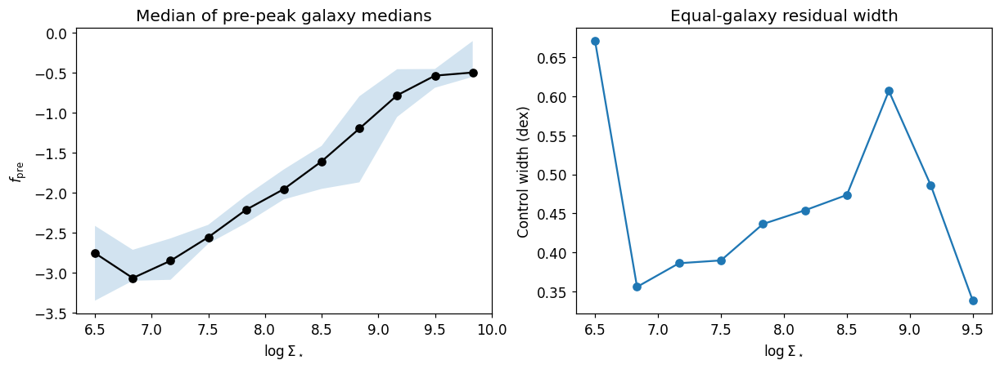

**Control interpretation:** the shaded range is galaxy-to-galaxy scatter, not a confidence interval. This internal pre-peak reference is unchanged from Q3; positive residuals mean above this control, not proof of externally triggered SF.

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(11, 4), layout='constrained')
ref = prepeak_reference.loc[prepeak_reference.supported]
axes[0].plot(ref.sigma_center, ref.reference, 'o-', color='black')
axes[0].fill_between(ref.sigma_center, ref.galaxy_p16, ref.galaxy_p84, alpha=.2)
axes[0].set(xlabel=r'$\log\Sigma_\star$', ylabel=r'$f_{\rm pre}$', title='Median of pre-peak galaxy medians')
axes[1].plot(control_scatter.sigma_center, control_scatter.sigma_pre, 'o-')
axes[1].set(xlabel=r'$\log\Sigma_\star$', ylabel='Control width (dex)', title='Equal-galaxy residual width')
plt.show()
display(Markdown('**Control interpretation:** the shaded range is galaxy-to-galaxy scatter, '
    'not a confidence interval. This internal pre-peak reference is unchanged from Q3; '
    'positive residuals mean above this control, not proof of externally triggered SF.'))

## 5. Local reference, spatial support and coordinate conventions

For each galaxy, $f_g$ is its own median $y$ in the same stellar-density bins,
requiring 20 pixels/bin. Interpolate between adjacent supported centres, with
no extrapolation or interpolation across missing bins:
$$\delta_{\rm local}=y-f_g(x).$$
This removes the galaxy's own first-order density trend, not every radial trend.
The environmental mask requires finite $\Delta_{\rm env}$ and $z_{\rm env}$;
the **joint mask** also requires finite $\delta_{\rm local}$. All four directional
curves use this same joint mask so comparisons do not change spatial support.
The maps retain their native valid support, with missing values distinct from zero.

Sky PA is $\operatorname{atan2}(E,N)$, east of north; N/E/S/W = 0/90/180/270 degrees.
Original pixels are retained without warping or resampling. Catalogue elliptical
$R/R_e$ is retained as geometry metadata. The gradient uses projected E/N in kpc, not deprojected coordinates. NGC4567/8 retains the inherited
union geometry and Q3 product weight. Both component centres are marked in its map,
but no single direction or additional independent-galaxy count is invented for it.

In [8]:
def interpolate_contiguous(x, centres, values, support):
    x = np.asarray(x, dtype=float)
    result = np.full(x.shape, np.nan)
    for j in range(len(centres)-1):
        if support[j] and support[j+1]:
            take = (x >= centres[j]) & (x <= centres[j+1])
            result[take] = np.interp(x[take], centres[j:j+2], values[j:j+2])
    return result


spatial = {}
support_rows = []
for row in q4_sample.itertuples(index=False):
    maps = load_galaxy_maps(row, geometry, SFR_HDU_PRIMARY)
    _, header = load_fits_map(row.mass_path, MASS_HDU, return_header=True)
    shape = maps['log_sigma_star'].shape
    sf_flat = np.flatnonzero(maps['sf_mask'])
    x = maps['log_sigma_star'].ravel()[sf_flat].astype(np.float32)
    y = maps['log_sigma_sfr'].ravel()[sf_flat].astype(np.float32)
    keep = np.isfinite(x) & np.isfinite(y) & (x >= sigma_edges[0]) & (x < sigma_edges[-1])
    flat_index = sf_flat[keep]
    payload = spaxels[row.GALID]
    # Assert the exact Q3 ordering before projecting its residuals back to pixels.
    np.testing.assert_array_equal(x[keep], payload['x'])
    np.testing.assert_array_equal(y[keep], payload['y'])
    own = reference_by_galaxy.loc[reference_by_galaxy.GALID.eq(row.GALID)].sort_values('sigma_bin')
    own_values = own.galaxy_median_logSigmaSFR.to_numpy()
    own_supported = np.isfinite(own_values)
    local_reference = interpolate_contiguous(payload['x'], sigma_centres, own_values, own_supported)
    local = payload['y'].astype(float) - local_reference
    for key, values in [('delta_env', payload['delta']), ('z_env', payload['z']), ('delta_local', local)]:
        arr = np.full(shape, np.nan)
        arr.ravel()[flat_index] = values
        maps[key] = arr
    env = maps['sf_mask'] & np.isfinite(maps['delta_env']) & np.isfinite(maps['z_env'])
    joint = env & np.isfinite(maps['delta_local'])
    comp = geometry.loc[geometry.notebook_product_id.eq(row.GALID)].copy()
    yy, xx = np.indices(shape, dtype=float)
    ra, dec = WCS(header).celestial.pixel_to_world_values(xx, yy)
    if len(comp) == 1:
        c = comp.iloc[0]
        east, north = tangent_offsets_arcsec(ra, dec, c.center_ra_deg, c.center_dec_deg)
        pixel_pa = np.mod(np.rad2deg(np.arctan2(east, north)), 360)
        # A pixel exactly at the centre has no meaningful direction.
        pixel_pa[np.hypot(east, north) < 1e-8] = np.nan
    else:
        c = comp.iloc[0]  # reference origin for display only; NOT a direction centre
        east, north = tangent_offsets_arcsec(ra, dec, c.center_ra_deg, c.center_dec_deg)
        pixel_pa = np.full(shape, np.nan)
    maps.update(header=header, components=comp, east=east, north=north, pixel_pa=pixel_pa,
                environment_mask=env, joint_mask=joint,
                local_reference=local_reference, own_values=own_values,
                stage=row.stage, inclination=row.inclination)
    for key in ['ew_ha', 'halpha_sigma_intrinsic', 'mass_bin_id', 'gas_bin_id',
                'ngist_mask', 'classification_mask']:
        maps.pop(key, None)
    spatial[row.GALID] = maps
    support_rows.append(dict(GALID=row.GALID, stage=row.stage, inclination=row.inclination,
        N_Q3_mass_range=len(flat_index), N_env=int(env.sum()),
        N_local=int(np.isfinite(maps['delta_local']).sum()), N_joint=int(joint.sum()),
        joint_fraction_of_env=float(joint.sum()/env.sum()) if env.any() else np.nan,
        N_local_supported_bins=int(own_supported.sum()),
        multiple_centres=len(comp) != 1,
        N_env_colour_clipped=int(np.count_nonzero(np.abs(maps['delta_env']) > RESIDUAL_VLIM)),
        N_local_colour_clipped=int(np.count_nonzero(np.abs(maps['delta_local']) > RESIDUAL_VLIM))))
map_support = pd.DataFrame(support_rows)
display(map_support)
print('Q3 vector-to-map identity verified for every eligible product.')

Q3 vector-to-map identity verified for every eligible product.


,GALID,stage,inclination,N_Q3_mass_range,N_env,N_local,N_joint,joint_fraction_of_env,N_local_supported_bins,multiple_centres,N_env_colour_clipped,N_local_colour_clipped
0,IC3392,post-peak,68,13897,13897,13868,13868,0.997913,5,False,99,143
1,NGC4064,post-peak,70,3273,3273,3213,3213,0.981668,4,False,396,287
2,NGC4189,pre-peak,42,96364,96364,96357,96357,0.999927,6,False,4539,4823
3,NGC4254,pre-peak,39,661963,658873,658991,658873,1.000000,11,False,96842,52759
4,NGC4293,post-peak,67,471,471,310,310,0.658174,2,False,4,11
5,NGC4294,pre-peak,74,68833,68833,68798,68798,0.999492,7,False,3982,2476
6,NGC4298,close-to-peak,52,144157,144157,144120,144120,0.999743,7,False,4504,5808
7,NGC4321,pre-peak,32,454131,454110,454129,454110,1.000000,9,False,33236,34168
8,NGC4351,pre-peak,48,30711,30711,30613,30613,0.996809,6,False,552,320
9,NGC4380,post-peak,61,64097,64097,61825,61825,0.964554,5,False,9723,1436


## 6. Five-panel map gallery for every Q3-eligible product: no H I arrows

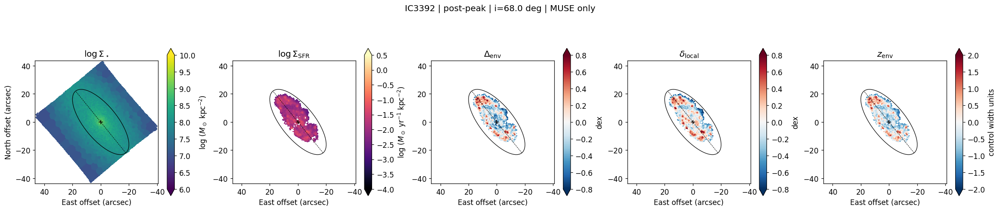

**IC3392 interpretation:** the environmental median is -0.115 dex; the common directional support retains 99.8% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 99, 143, 7]; numerical analysis uses unclipped values.

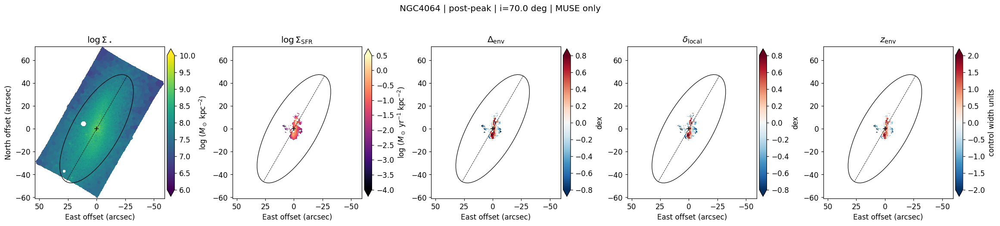

**NGC4064 interpretation:** the environmental median is +0.105 dex; the common directional support retains 98.2% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 396, 287, 131]; numerical analysis uses unclipped values.

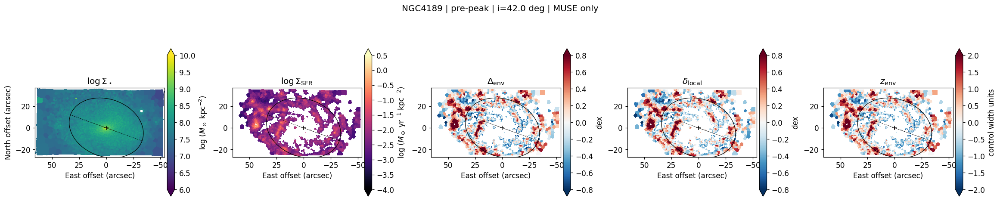

**NGC4189 interpretation:** the environmental median is +0.002 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 4539, 4823, 3586]; numerical analysis uses unclipped values.

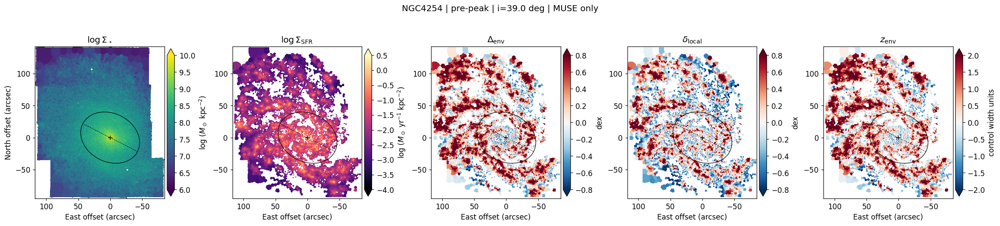

**NGC4254 interpretation:** the environmental median is +0.245 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [27, 0, 96842, 52759, 90531]; numerical analysis uses unclipped values.

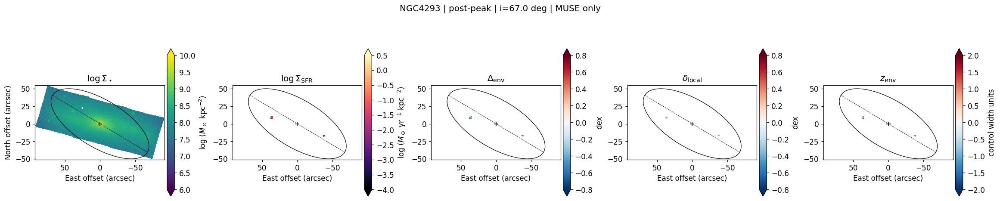

**NGC4293 interpretation:** the environmental median is -0.373 dex; the common directional support retains 65.8% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [31, 0, 4, 11, 0]; numerical analysis uses unclipped values.

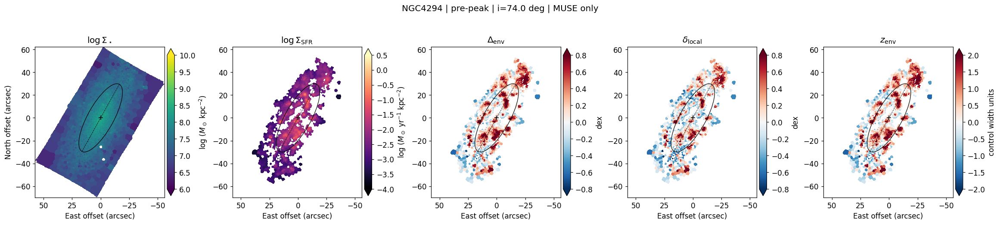

**NGC4294 interpretation:** the environmental median is +0.100 dex; the common directional support retains 99.9% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 3982, 2476, 3939]; numerical analysis uses unclipped values.

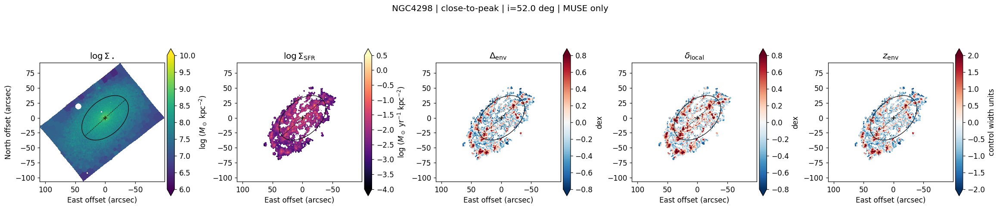

**NGC4298 interpretation:** the environmental median is -0.138 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 4504, 5808, 2589]; numerical analysis uses unclipped values.

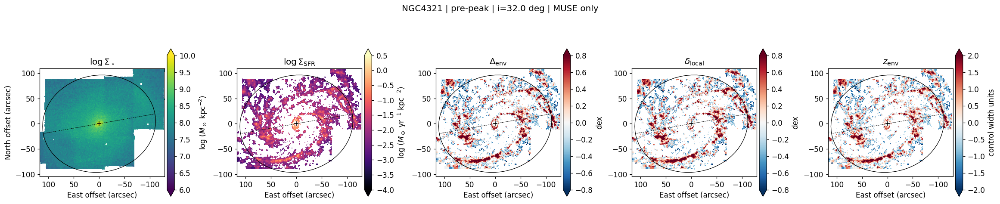

**NGC4321 interpretation:** the environmental median is -0.015 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [193, 22, 33236, 34168, 23968]; numerical analysis uses unclipped values.

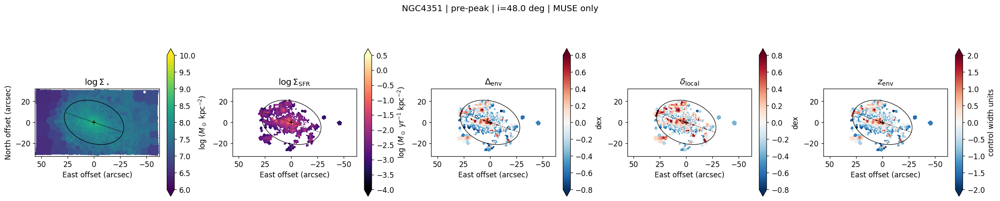

**NGC4351 interpretation:** the environmental median is -0.182 dex; the common directional support retains 99.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 552, 320, 398]; numerical analysis uses unclipped values.

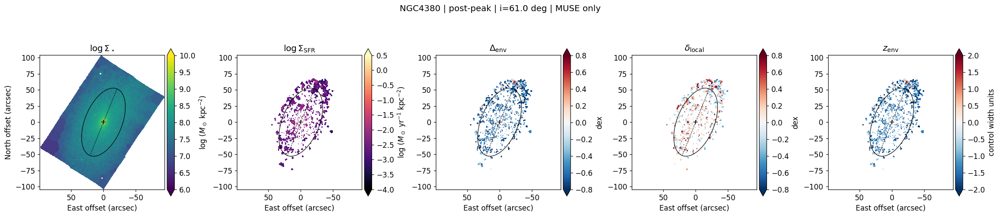

**NGC4380 interpretation:** the environmental median is -0.536 dex; the common directional support retains 96.5% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [6, 0, 9723, 1436, 6332]; numerical analysis uses unclipped values.

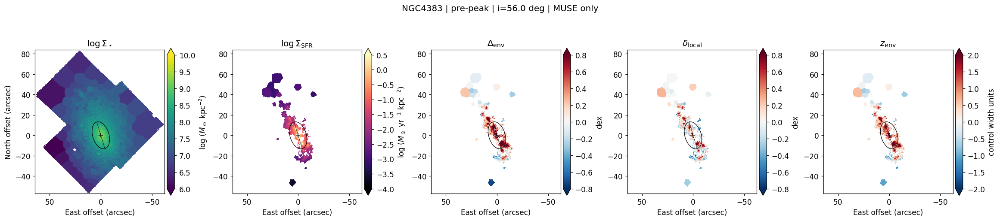

**NGC4383 interpretation:** the environmental median is +0.067 dex; the common directional support retains 99.5% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [6519, 28, 1525, 375, 774]; numerical analysis uses unclipped values.

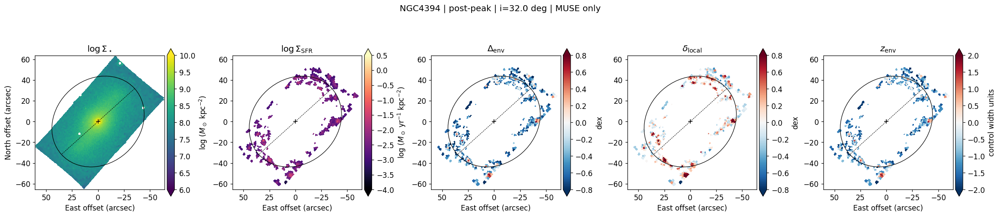

**NGC4394 interpretation:** the environmental median is -0.505 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [251, 0, 3503, 918, 1452]; numerical analysis uses unclipped values.

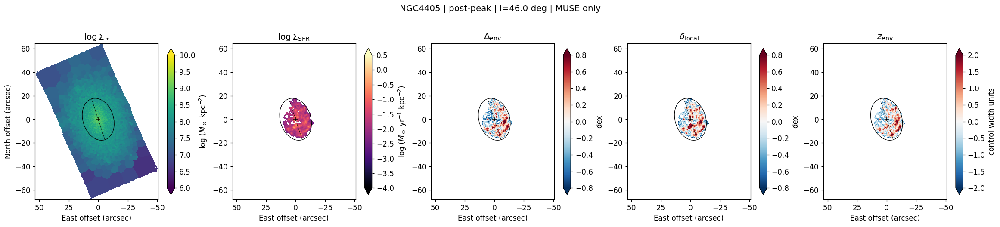

**NGC4405 interpretation:** the environmental median is -0.020 dex; the common directional support retains 99.4% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 458, 406, 177]; numerical analysis uses unclipped values.

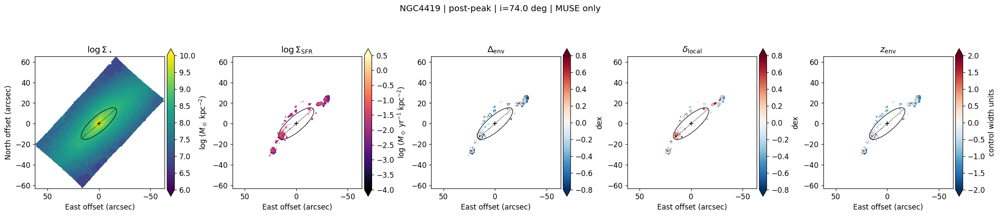

**NGC4419 interpretation:** the environmental median is -0.266 dex; the common directional support retains 96.4% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [103, 0, 266, 148, 94]; numerical analysis uses unclipped values.

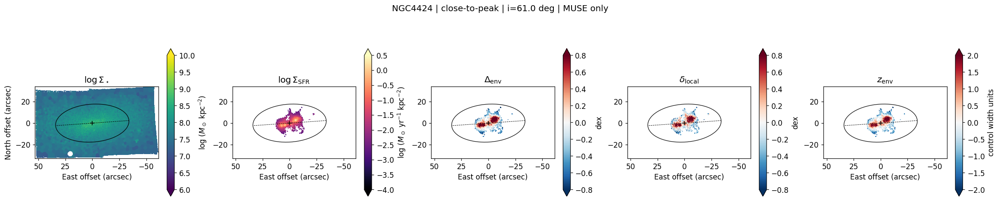

**NGC4424 interpretation:** the environmental median is -0.040 dex; the common directional support retains 98.6% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 904, 777, 564]; numerical analysis uses unclipped values.

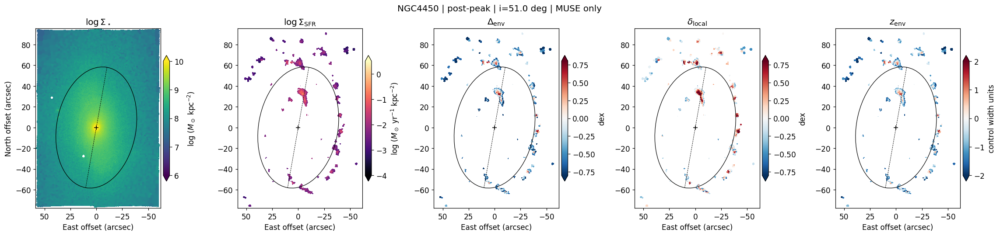

**NGC4450 interpretation:** the environmental median is -0.447 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [383, 0, 2443, 712, 1135]; numerical analysis uses unclipped values.

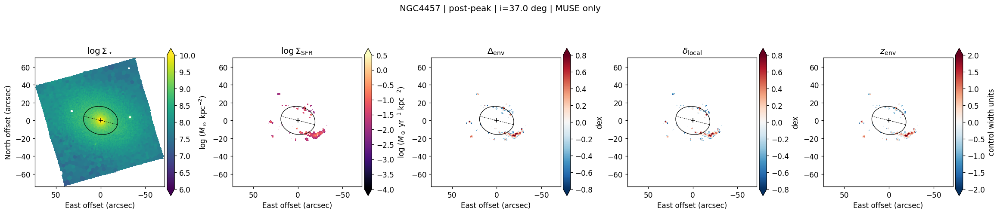

**NGC4457 interpretation:** the environmental median is +0.011 dex; the common directional support retains 98.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [469, 0, 239, 156, 83]; numerical analysis uses unclipped values.

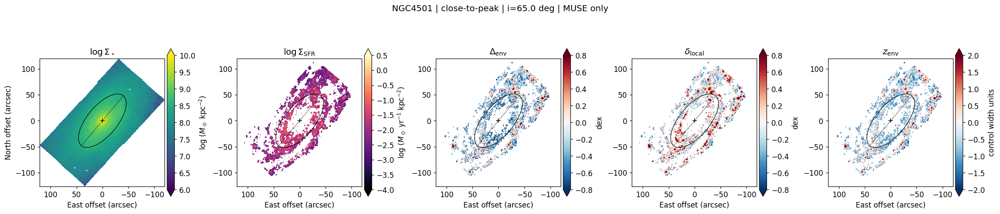

**NGC4501 interpretation:** the environmental median is -0.242 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [607, 0, 10659, 8513, 2997]; numerical analysis uses unclipped values.

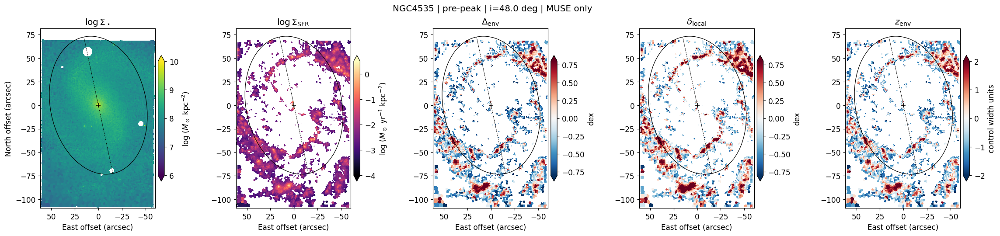

**NGC4535 interpretation:** the environmental median is -0.194 dex; the common directional support retains 99.8% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [15, 0, 17951, 17938, 10768]; numerical analysis uses unclipped values.

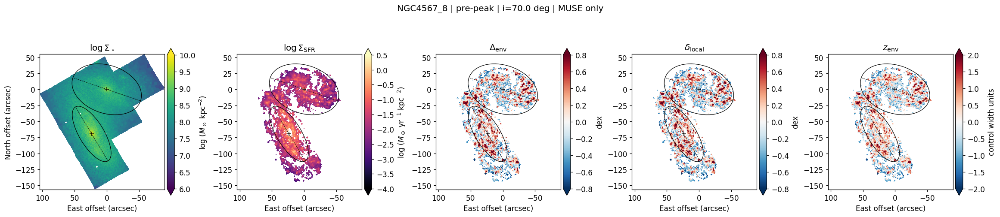

**NGC4567_8 interpretation:** the environmental median is -0.005 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [56, 11, 8816, 8942, 4430]; numerical analysis uses unclipped values. **Two centres: maps only, no single direction assigned.**

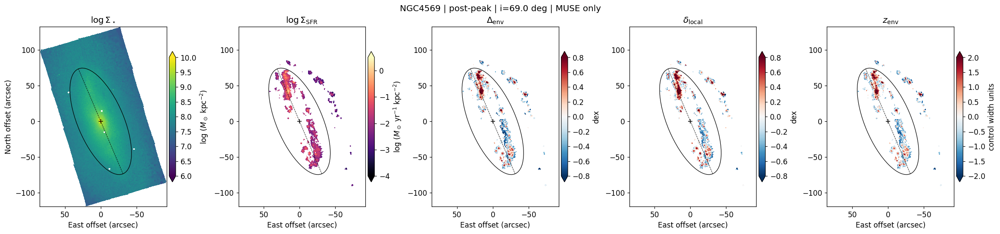

**NGC4569 interpretation:** the environmental median is -0.078 dex; the common directional support retains 99.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [128, 0, 3463, 3289, 1892]; numerical analysis uses unclipped values.

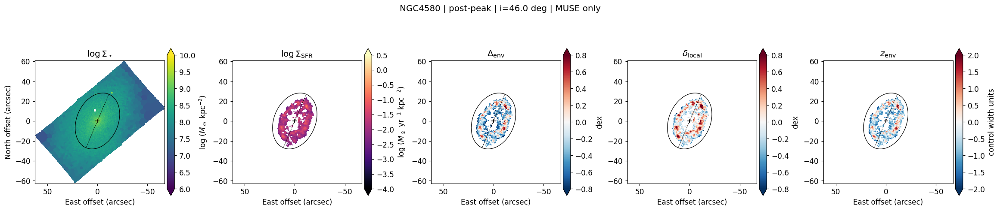

**NGC4580 interpretation:** the environmental median is -0.243 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 888, 364, 163]; numerical analysis uses unclipped values.

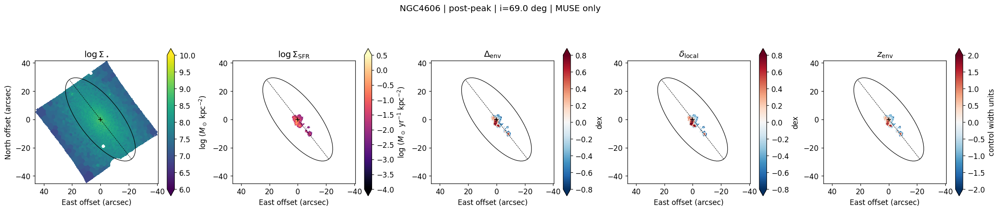

**NGC4606 interpretation:** the environmental median is -0.057 dex; the common directional support retains 96.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 81, 89, 23]; numerical analysis uses unclipped values.

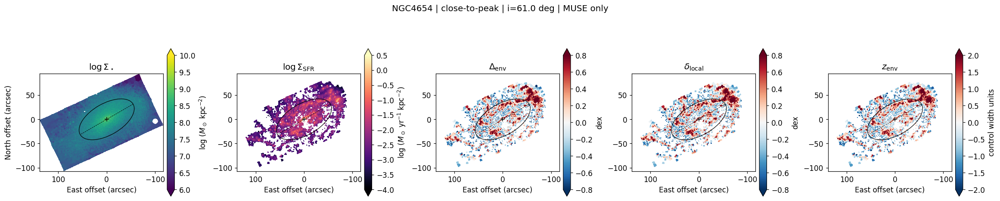

**NGC4654 interpretation:** the environmental median is -0.035 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 21154, 22056, 18513]; numerical analysis uses unclipped values.

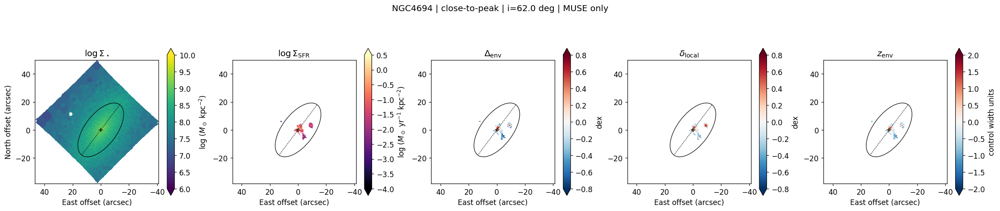

**NGC4694 interpretation:** the environmental median is -0.162 dex; the common directional support retains 91.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 30, 9, 0]; numerical analysis uses unclipped values.

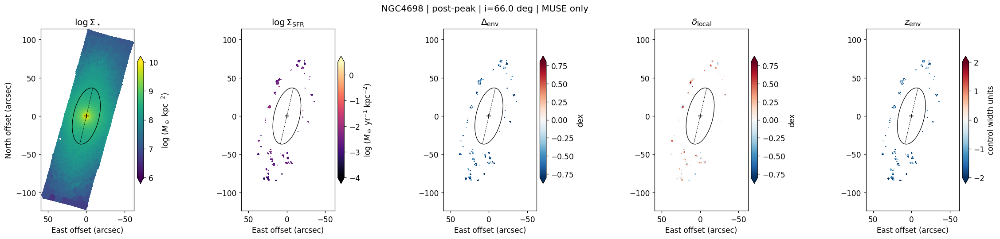

**NGC4698 interpretation:** the environmental median is -0.650 dex; the common directional support retains 99.2% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [200, 0, 1711, 97, 936]; numerical analysis uses unclipped values.

In [9]:
def decorate_blind_map(ax, maps):
    anchor = maps['components'].iloc[0]
    for c in maps['components'].itertuples(index=False):
        e, n = tangent_offsets_arcsec(c.center_ra_deg, c.center_dec_deg,
                                      anchor.center_ra_deg, anchor.center_dec_deg)
        ax.add_patch(Ellipse((e, n), 2*c.a_re_arcsec, 2*c.b_re_arcsec,
            angle=90-c.pa_deg_east_of_north, fill=False, edgecolor='black', lw=.8))
        a = np.deg2rad(c.pa_deg_east_of_north)
        ax.plot(e+np.array([-1,1])*c.a_re_arcsec*np.sin(a),
                n+np.array([-1,1])*c.a_re_arcsec*np.cos(a), 'k--', lw=.6)
        ax.plot(e,n,'k+',ms=7)
    ax.set_aspect('equal')
    ax.set_xlabel('East offset (arcsec)')
    ax.invert_xaxis()

map_gallery_rows = []
for galid, m in spatial.items():
    panel_data = [np.where(m['valid_disc_mask'],m['log_sigma_star'],np.nan),
                  np.where(m['sf_mask'],m['log_sigma_sfr'],np.nan),
                  m['delta_env'],m['delta_local'],m['z_env']]
    labels = [r'$\log\Sigma_\star$',r'$\log\Sigma_{\rm SFR}$',
              r'$\Delta_{\rm env}$',r'$\delta_{\rm local}$',r'$z_{\rm env}$']
    ranges = [(6,10),(-4,.5),(-RESIDUAL_VLIM,RESIDUAL_VLIM),
              (-RESIDUAL_VLIM,RESIDUAL_VLIM),(-Z_VLIM,Z_VLIM)]
    units = [r'log ($M_\odot$ kpc$^{-2}$)',r'log ($M_\odot$ yr$^{-1}$ kpc$^{-2}$)',
             'dex','dex','control width units']
    fig, axes = plt.subplots(1,5,figsize=(21,4.8),layout='constrained')
    for ax,data,label,limits,cmap,unit in zip(axes,panel_data,labels,ranges,
                                            ['viridis','magma','RdBu_r','RdBu_r','RdBu_r'],units):
        im=ax.pcolormesh(m['east'],m['north'],np.ma.masked_invalid(data),
            shading='nearest',cmap=cmap,vmin=limits[0],vmax=limits[1],rasterized=True)
        decorate_blind_map(ax,m)
        ax.set_title(label)
        fig.colorbar(im,ax=ax,shrink=.70,pad=.02,extend='both',label=unit)
    axes[0].set_ylabel('North offset (arcsec)')
    fig.suptitle(f'{galid} | {m["stage"]} | i={m["inclination"]:.1f} deg | MUSE only',fontsize=13)
    plt.show()
    median = float(np.nanmedian(m['delta_env']))
    q = map_support.loc[map_support.GALID.eq(galid)].iloc[0]
    clipping = [int(np.count_nonzero(np.isfinite(d)&((d<lo)|(d>hi))))
                for d,(lo,hi) in zip(panel_data,ranges)]
    map_gallery_rows.append(dict(GALID=galid,median_env=median,clipped_pixels=clipping))
    display(Markdown(f'**{galid} interpretation:** the environmental median is {median:+.3f} dex; '
        f'the common directional support retains {q.joint_fraction_of_env:.1%} of environmental pixels. '
        'Red in the local map means stronger than this galaxy\'s own density trend; only the environmental '
        'map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes '
        'and effective radii, not H I directions. '
        f'Colour-clipped counts (panels 1--5): {clipping}; numerical analysis uses unclipped values.'
        + (' **Two centres: maps only, no single direction assigned.**' if q.multiple_centres else '')))
map_gallery_summary = pd.DataFrame(map_gallery_rows)

## 7. Fit first-order planes before introducing H I metadata

For each residual $X\in\{\delta_{\rm local},\Delta_{\rm env},z_{\rm env}\}$ fit
$$X_i=X_0+aE_i+bN_i,\qquad g=\sqrt{a^2+b^2},\qquad
\theta_X=\operatorname{atan2}(a,b)\bmod360.$$
$E,N$ are the original sky offsets multiplied by `kpc_per_arcsec` in
`MAUVE_effective_radii.csv`; its consistency with `distance_mpc` is checked.
There is **no additional inclination correction**. $a,b,g$ are in dex/kpc for
local/environmental residuals and control-width-units/kpc for $z$.

Use ordinary least squares with equal weight per native joint-mask pixel: this
is a projected-area-weighted descriptive fit, not independent-region sampling.
Use the same pixels for all three planes and hemisphere statistics. Centre and
scale the coordinate design for numerical stability, then transform coefficients
back to the actual galaxy-centred kpc coordinates. Require at least 50 pixels,
full rank and condition number below $10^8$ (numerical checks only). A numerical
zero gradient has no defined PA. Report count, spatial span, condition, RMSE and
$R^2$; no naive pixel-level regression error is reported.

The fitted directional derivative is exactly
$$g_X(\theta)=a_X\sin\theta+b_X\cos\theta.$$
Its maximum is the analytic vector direction, not a 1-degree grid estimate.
**Do not confuse this with 360 separate 1-D regressions.** On an anisotropic
footprint, omitting the perpendicular coordinate gives a slope
$(u^T C\beta)/(u^T C u)$, generally different from $u^T\beta$, where
$u=(\sin\theta,\cos\theta)$, $C$ is the positional covariance and $\beta=(a,b)$.
A sinusoidal derivative plot is imposed by the fitted plane and is not evidence
that the raw map is a smooth dipole; inspect fit diagnostics and actual maps.

The inherited 180-degree hemisphere scan (and optional 90-degree sector scan)
is retained only as a robustness diagnostic. Its own maxima and possible median
plateaus are recorded separately. **They do not set the primary gradient PA.**
After fitting, calculate all hemisphere medians/fractions directly at the continuous
$\theta_{\rm SF}$, omitting only boundary/centre pixels and requiring 20 per side.

In [10]:
METRICS = ('local','env','z','enh')
METRIC_LABELS = {'local':r'$A_{\rm local}$ (dex)','env':r'$A_{\rm env}$ (dex)',
                 'z':r'$A_z$','enh':r'$A_{\rm enh}$ (fraction)'}

def angle_distance(a,b):
    return np.abs((np.asarray(a)-np.asarray(b)+180)%360-180)

def scan_arrays(pa, values, width=180, min_side=MIN_SIDE_PIXELS):
    pa = np.asarray(pa,dtype=float)
    values = np.asarray(values,dtype=float)
    assert values.shape == (pa.size,3)  # local, env, z on identical support
    if width not in (90,180):
        raise ValueError('Supported full sector widths: 90 or 180 degrees')
    out = {k:np.full((360,2),np.nan) for k in METRICS}
    counts = np.zeros((360,2),dtype=int)
    for j in range(180):
        sep = (pa-j+180)%360-180
        plus = np.abs(sep) < width/2-1e-10
        minus = np.abs(sep) > 180-width/2+1e-10
        counts[j] = [plus.sum(),minus.sum()]
        counts[j+180] = counts[j,::-1]
        if min(counts[j]) < min_side:
            continue
        for side, select in enumerate((plus,minus)):
            med = np.median(values[select],axis=0)
            for k,v in zip(('local','env','z'),med):
                out[k][j,side] = v
            out['enh'][j,side] = np.mean(values[select,2]>1)
        for k in METRICS:
            out[k][j+180] = out[k][j,::-1]
    return {'sides':out,'A':{k:v[:,0]-v[:,1] for k,v in out.items()},'counts':counts}

def peak_summary(curve, metric):
    a = curve['A'][metric]
    good = np.isfinite(a)
    base = dict(theta_deg=np.nan,A_max=np.nan,M_plus=np.nan,M_minus=np.nan,
        N_plus=0,N_minus=0,valid_angle_fraction=float(good.mean()),peak_defined=False,
        exact_peak_count=0,exact_peak_angles=[],near_peak_angles=[],near_peak_fraction=np.nan,
        near_peak_span_deg=np.nan,unique_peak=False)
    if not good.any():
        return base
    vmax = float(np.nanmax(a))
    base['A_max'] = vmax
    if vmax <= 1e-12:
        return base
    peaks = np.flatnonzero(np.isclose(a,vmax,rtol=0,atol=1e-12))
    near = np.flatnonzero(good & (a >= PEAK_FRACTION*vmax))
    j = int(peaks[0])
    base.update(theta_deg=float(j),M_plus=float(curve['sides'][metric][j,0]),
        M_minus=float(curve['sides'][metric][j,1]),N_plus=int(curve['counts'][j,0]),
        N_minus=int(curve['counts'][j,1]),peak_defined=True,exact_peak_count=len(peaks),
        exact_peak_angles=peaks.tolist(),unique_peak=len(peaks)==1,
        near_peak_angles=near.tolist(),near_peak_fraction=len(near)/360,
        near_peak_span_deg=float(360-np.max(np.diff(np.r_[near,near[0]+360]))))
    return base

curves, curves90, direction_inputs, rows, excluded_rows = {}, {}, {}, [], []
for galid,m in spatial.items():
    if len(m['components']) != 1:
        excluded_rows.append(dict(GALID=galid,reason='multiple physical centres in one Q3 product'))
        continue
    joint = m['joint_mask'] & np.isfinite(m['pixel_pa'])
    pa = m['pixel_pa'][joint]
    values = np.column_stack([m['delta_local'][joint],m['delta_env'][joint],m['z_env'][joint]])
    direction_inputs[galid] = dict(pa=pa,values=values,radius=m['radius_re'][joint])
    curve = scan_arrays(pa,values)
    curves[galid] = curve
    if RUN_90_DEG_SECTORS:
        curves90[galid] = scan_arrays(pa,values,width=90)
    for metric in METRICS:
        rows.append(dict(GALID=galid,stage=m['stage'],metric=metric,**peak_summary(curve,metric)))
    print(f'{galid}: {len(pa):,} joint pixels; {np.isfinite(curve["A"]["local"]).mean():.0%} of angles supported')
direction_summary = pd.DataFrame(rows)
direction_exclusions = pd.DataFrame(excluded_rows,columns=['GALID','reason'])
preferred_rows = []
for row in direction_summary.loc[direction_summary.metric.eq('local')].itertuples(index=False):
    record = dict(GALID=row.GALID,stage=row.stage,theta_SF=row.theta_deg,A_local_max=row.A_max,
        peak_defined=row.peak_defined,unique_peak=row.unique_peak,
        valid_angle_fraction=row.valid_angle_fraction,near_peak_span_deg=row.near_peak_span_deg)
    for k in METRICS:
        record.update({f'{k}_plus':np.nan,f'{k}_minus':np.nan,f'A_{k}_at_SF':np.nan})
    if row.peak_defined:
        j=int(row.theta_deg)
        for k in METRICS:
            record[f'{k}_plus'],record[f'{k}_minus']=curves[row.GALID]['sides'][k][j]
            record[f'A_{k}_at_SF']=curves[row.GALID]['A'][k][j]
    preferred_rows.append(record)
preferred_sides = pd.DataFrame(preferred_rows)
# A reproducible freeze of the inferred result before loading any H I sector.
INFERENCE_SHA256 = hashlib.sha256(direction_summary.to_json(orient='records').encode()).hexdigest()
print('Secondary hemisphere-scan maxima follow; these do not set the plane-gradient direction.')
display(direction_summary.drop(columns=['exact_peak_angles','near_peak_angles']))
display(preferred_sides)
display(direction_exclusions)
print('MUSE inference checksum:',INFERENCE_SHA256)


hemisphere_summary=direction_summary.copy(deep=True)
hemisphere_preferred_sides=preferred_sides.copy(deep=True)

def fit_residual_planes(east_kpc,north_kpc,values,min_pixels=MIN_PLANE_PIXELS):
    xy=np.column_stack([east_kpc,north_kpc]).astype(float)
    values=np.asarray(values,dtype=float)
    assert values.shape==(len(xy),3)
    assert np.isfinite(xy).all() and np.isfinite(values).all()
    base=dict(N_pixels=len(xy),fit_ok=False,fit_status='insufficient pixels',rank=0,
        condition=np.inf,coefficients=np.full((3,3),np.nan),rmse=np.full(3,np.nan),r2=np.full(3,np.nan),
        east_span_kpc=float(np.ptp(xy[:,0])) if len(xy) else np.nan,
        north_span_kpc=float(np.ptp(xy[:,1])) if len(xy) else np.nan)
    if len(xy)<min_pixels: return base
    centre=xy.mean(axis=0)
    scale=np.sqrt(np.mean(np.sum((xy-centre)**2,axis=1)))
    if not np.isfinite(scale) or scale<=0:
        base['fit_status']='zero spatial extent';return base
    design=np.column_stack([np.ones(len(xy)),(xy-centre)/scale])
    coefficients,_,rank,singular=np.linalg.lstsq(design,values,rcond=None)
    condition=float(singular[0]/singular[-1]) if singular[-1]>0 else np.inf
    base.update(rank=int(rank),condition=condition)
    if rank<3 or condition>MAX_PLANE_CONDITION:
        base['fit_status']='rank deficient / numerically ill-conditioned footprint';return base
    # Explicit evaluation avoids spurious BLAS floating-point status warnings in this environment.
    predicted=design[:,0,None]*coefficients[0]+design[:,1,None]*coefficients[1]+design[:,2,None]*coefficients[2]
    slopes=coefficients[1:]/scale
    origin=coefficients[0]-np.sum(centre[:,None]*slopes,axis=0)
    sse=np.sum((values-predicted)**2,axis=0)
    sst=np.sum((values-values.mean(axis=0))**2,axis=0)
    r2=np.full(3,np.nan)
    np.divide(sse,sst,out=r2,where=sst>0)
    base.update(fit_ok=True,fit_status='OK',coefficients=np.vstack([origin,slopes]),
        rmse=np.sqrt(sse/len(values)),r2=1-r2)
    return base

def sides_at_angle(pa,values,theta,width=180,min_side=MIN_SIDE_PIXELS):
    # Direct continuous-angle evaluation; never round to PA_GRID.
    sep=angle_distance(pa,theta)
    plus=sep<width/2-1e-10
    minus=sep>180-width/2+1e-10
    result=dict(N_plus=int(plus.sum()),N_minus=int(minus.sum()),side_supported=False)
    for k in METRICS:
        result.update({f'{k}_plus':np.nan,f'{k}_minus':np.nan,f'A_{k}_at_SF':np.nan})
    if min(plus.sum(),minus.sum())<min_side: return result
    result['side_supported']=True
    for side,mask in [('plus',plus),('minus',minus)]:
        for j,k in enumerate(('local','env','z')):
            result[f'{k}_{side}']=float(np.median(values[mask,j]))
        result[f'enh_{side}']=float(np.mean(values[mask,2]>1))
    for k in METRICS:
        result[f'A_{k}_at_SF']=result[f'{k}_plus']-result[f'{k}_minus']
    return result

plane_fits,gradient_curves,gradient_rows,gradient_preferred={}, {}, [], []
for galid,d in direction_inputs.items():
    m=spatial[galid];c=m['components'].iloc[0]
    scale=float(c.kpc_per_arcsec)
    if not np.isfinite(scale) or scale<=0:
        raise ValueError(f'{galid}: invalid catalogue kpc/arcsec')
    np.testing.assert_allclose(scale,float(c.distance_mpc)*1000*np.pi/648000,rtol=5e-5)
    mask=m['joint_mask']&np.isfinite(m['pixel_pa'])
    d['east_kpc']=m['east'][mask]*scale
    d['north_kpc']=m['north'][mask]*scale
    fit=fit_residual_planes(d['east_kpc'],d['north_kpc'],d['values'])
    plane_fits[galid]=fit
    gradient_curves[galid]={}
    for j,metric in enumerate(('local','env','z')):
        x0,a,b=fit['coefficients'][:,j]
        magnitude=float(np.hypot(a,b))
        defined=fit['fit_ok'] and np.isfinite(magnitude) and magnitude>GRADIENT_ZERO_TOL
        theta=float(np.rad2deg(np.arctan2(a,b))%360) if defined else np.nan
        gradient_rows.append(dict(GALID=galid,stage=m['stage'],metric=metric,X0=x0,
            a_east=a,b_north=b,gradient_magnitude=magnitude,theta_deg=theta,direction_defined=defined,
            fit_ok=fit['fit_ok'],fit_status=fit['fit_status'],N_pixels=fit['N_pixels'],
            design_rank=fit['rank'],design_condition=fit['condition'],RMSE=fit['rmse'][j],R2=fit['r2'][j],
            east_span_kpc=fit['east_span_kpc'],north_span_kpc=fit['north_span_kpc'],
            kpc_per_arcsec=scale,distance_mpc=float(c.distance_mpc),
            unit='control-width units/kpc' if metric=='z' else 'dex/kpc'))
        gradient_curves[galid][metric]=a*np.sin(np.deg2rad(PA_GRID))+b*np.cos(np.deg2rad(PA_GRID))
        if metric=='local':
            grad_record=dict(GALID=galid,stage=m['stage'],theta_SF=theta,
                gradient_magnitude=magnitude,a_east=a,b_north=b,fit_ok=fit['fit_ok'],
                fit_status=fit['fit_status'],direction_defined=defined,R2=fit['r2'][j])
            grad_record.update(sides_at_angle(d['pa'],d['values'],theta))
            gradient_preferred.append(grad_record)
gradient_summary=pd.DataFrame(gradient_rows)
preferred_sides=pd.DataFrame(gradient_preferred)
direction_comparison=preferred_sides[['GALID','stage','theta_SF','gradient_magnitude']].copy()
for metric in ('env','z'):
    other=gradient_summary.loc[gradient_summary.metric.eq(metric)].set_index('GALID')
    direction_comparison[f'theta_{metric}']=direction_comparison.GALID.map(other.theta_deg)
    direction_comparison[f'delta_local_{metric}_deg']=angle_distance(direction_comparison.theta_SF,direction_comparison[f'theta_{metric}'])
direction_comparison['theta_hemisphere']=direction_comparison.GALID.map(hemisphere_preferred_sides.set_index('GALID').theta_SF)
direction_comparison['delta_gradient_hemisphere_deg']=angle_distance(direction_comparison.theta_SF,direction_comparison.theta_hemisphere)
GRADIENT_INFERENCE_SHA256=hashlib.sha256(gradient_summary.to_json(orient='records').encode()).hexdigest()
GRADIENT_SIDES_SHA256=hashlib.sha256(preferred_sides.to_json(orient='records').encode()).hexdigest()
display(gradient_summary)
display(direction_comparison)
display(preferred_sides)
print('Primary estimator: local plane gradient; no H I angles consumed.')


IC3392: 13,868 joint pixels; 100% of angles supported
NGC4064: 3,213 joint pixels; 100% of angles supported
NGC4189: 96,357 joint pixels; 100% of angles supported
NGC4254: 658,873 joint pixels; 100% of angles supported
NGC4293: 310 joint pixels; 96% of angles supported
NGC4294: 68,798 joint pixels; 100% of angles supported
NGC4298: 144,120 joint pixels; 100% of angles supported
NGC4321: 454,110 joint pixels; 100% of angles supported
NGC4351: 30,613 joint pixels; 100% of angles supported
NGC4380: 61,825 joint pixels; 100% of angles supported
NGC4383: 25,074 joint pixels; 100% of angles supported
NGC4394: 31,915 joint pixels; 100% of angles supported
NGC4405: 13,489 joint pixels; 100% of angles supported
NGC4419: 5,556 joint pixels; 100% of angles supported
NGC4424: 8,868 joint pixels; 100% of angles supported
NGC4450: 17,186 joint pixels; 100% of angles supported
NGC4457: 5,530 joint pixels; 100% of angles supported
NGC4501: 251,898 joint pixels; 100% of angles supported
NGC4535: 186,71

,GALID,stage,metric,theta_deg,A_max,M_plus,M_minus,N_plus,N_minus,valid_angle_fraction,peak_defined,exact_peak_count,near_peak_fraction,near_peak_span_deg,unique_peak
0,IC3392,post-peak,local,124.0,0.144588,0.062925,-0.081663,6317,7551,1.0,True,1,0.044444,15.0,True
1,IC3392,post-peak,env,121.0,0.130140,-0.048866,-0.179006,6488,7380,1.0,True,1,0.058333,20.0,True
2,IC3392,post-peak,z,114.0,0.277027,-0.104171,-0.381198,6862,7006,1.0,True,1,0.058333,20.0,True
3,IC3392,post-peak,enh,111.0,0.057959,0.082857,0.024898,7000,6868,1.0,True,1,0.022222,7.0,True
4,NGC4064,post-peak,local,262.0,0.276359,0.101907,-0.174452,2210,1003,1.0,True,1,0.025000,8.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,NGC4694,close-to-peak,enh,36.0,0.086684,0.102837,0.016153,282,681,1.0,True,1,0.036111,14.0,True
96,NGC4698,post-peak,local,72.0,0.128835,0.074013,-0.054822,3835,2855,1.0,True,1,0.013889,5.0,True
97,NGC4698,post-peak,env,75.0,0.136204,-0.606144,-0.742349,4342,2348,1.0,True,2,0.013889,9.0,False
98,NGC4698,post-peak,z,72.0,0.320662,-1.374001,-1.694663,3835,2855,1.0,True,1,0.008333,5.0,True


,GALID,stage,theta_SF,A_local_max,peak_defined,unique_peak,valid_angle_fraction,near_peak_span_deg,local_plus,local_minus,A_local_at_SF,env_plus,env_minus,A_env_at_SF,z_plus,z_minus,A_z_at_SF,enh_plus,enh_minus,A_enh_at_SF
0,IC3392,post-peak,124.0,0.144588,True,True,1.000000,15.0,0.062925,-0.081663,0.144588,-0.047415,-0.176885,0.129470,-0.103179,-0.374165,0.270986,0.073769,0.037743,0.036026
1,NGC4064,post-peak,262.0,0.276359,True,True,1.000000,8.0,0.101907,-0.174452,0.276359,0.198479,-0.051693,0.250172,0.370070,-0.094842,0.464912,0.255204,0.110668,0.144536
2,NGC4189,pre-peak,51.0,0.074130,True,True,1.000000,3.0,0.041687,-0.032443,0.074130,0.038211,-0.052772,0.090983,0.096406,-0.120958,0.217364,0.204125,0.146360,0.057765
3,NGC4254,pre-peak,102.0,0.116033,True,True,1.000000,25.0,0.042823,-0.073210,0.116033,0.301891,0.163090,0.138802,0.725755,0.381530,0.344225,0.406992,0.287894,0.119099
4,NGC4293,post-peak,156.0,0.196543,True,False,0.961111,168.0,-0.079295,-0.275838,0.196543,-0.459611,-0.559740,0.100129,-0.970451,-1.233292,0.262841,0.041509,0.000000,0.041509
5,NGC4294,pre-peak,260.0,0.199812,True,True,1.000000,3.0,0.111629,-0.088184,0.199812,0.236583,0.012706,0.223877,0.602227,0.032105,0.570122,0.350221,0.152378,0.197843
6,NGC4298,close-to-peak,87.0,0.080533,True,True,1.000000,6.0,0.026029,-0.054504,0.080533,-0.105449,-0.182714,0.077264,-0.242228,-0.413110,0.170882,0.120537,0.074966,0.045571
7,NGC4321,pre-peak,199.0,0.086546,True,True,1.000000,23.0,0.056862,-0.029684,0.086546,0.036293,-0.054396,0.090690,0.080372,-0.123514,0.203886,0.213632,0.159279,0.054353
8,NGC4351,pre-peak,39.0,0.231109,True,False,1.000000,13.0,0.073176,-0.157934,0.231109,-0.101940,-0.278114,0.176174,-0.237722,-0.672039,0.434317,0.088553,0.043563,0.044990
9,NGC4380,post-peak,66.0,0.056091,True,True,1.000000,5.0,0.015201,-0.040891,0.056091,-0.500690,-0.571098,0.070408,-1.116841,-1.299141,0.182300,0.012400,0.007679,0.004721


,GALID,reason
0,NGC4567_8,multiple physical centres in one Q3 product


,GALID,stage,metric,X0,a_east,b_north,gradient_magnitude,theta_deg,direction_defined,fit_ok,fit_status,N_pixels,design_rank,design_condition,RMSE,R2,east_span_kpc,north_span_kpc,kpc_per_arcsec,distance_mpc,unit
0,IC3392,post-peak,local,0.008529,0.250377,-0.197775,0.319067,128.305593,True,True,OK,13868,3,2.651914,0.283138,0.134249,2.511811,2.783807,0.079994,16.5,dex/kpc
1,IC3392,post-peak,env,-0.082265,0.221590,-0.120480,0.252225,118.533232,True,True,OK,13868,3,2.651914,0.302008,0.088149,2.511811,2.783807,0.079994,16.5,dex/kpc
2,IC3392,post-peak,z,-0.162344,0.489846,-0.271616,0.560111,119.008042,True,True,OK,13868,3,2.651914,0.645856,0.093407,2.511811,2.783807,0.079994,16.5,control-width units/kpc
3,NGC4064,post-peak,local,0.023556,-0.073758,-0.100085,0.124328,216.388514,True,True,OK,3213,3,1.972039,0.480551,0.007905,1.375897,1.903858,0.079994,16.5,dex/kpc
4,NGC4064,post-peak,env,0.103434,-0.197944,-0.104573,0.223869,242.152807,True,True,OK,3213,3,1.972039,0.490916,0.015151,1.375897,1.903858,0.079994,16.5,dex/kpc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,NGC4694,close-to-peak,env,-0.045857,0.399323,0.761961,0.860258,27.657779,True,True,OK,963,3,1.687062,0.299168,0.290695,1.087923,0.959930,0.079994,16.5,dex/kpc
71,NGC4694,close-to-peak,z,-0.073418,0.804344,1.521560,1.721079,27.862316,True,True,OK,963,3,1.687062,0.567364,0.313161,1.087923,0.959930,0.079994,16.5,control-width units/kpc
72,NGC4698,post-peak,local,0.083494,0.034502,0.017664,0.038761,62.888326,True,True,OK,6690,3,3.792722,0.256195,0.058771,6.047649,12.719050,0.079994,16.5,dex/kpc
73,NGC4698,post-peak,env,-0.597528,0.027357,0.016126,0.031756,59.482378,True,True,OK,6690,3,3.792722,0.259832,0.047417,6.047649,12.719050,0.079994,16.5,dex/kpc


,GALID,stage,theta_SF,gradient_magnitude,theta_env,delta_local_env_deg,theta_z,delta_local_z_deg,theta_hemisphere,delta_gradient_hemisphere_deg
0,IC3392,post-peak,128.305593,0.319067,118.533232,9.772362,119.008042,9.297551,124.0,4.305593
1,NGC4064,post-peak,216.388514,0.124328,242.152807,25.764293,242.707918,26.319404,262.0,45.611486
2,NGC4189,pre-peak,145.704652,0.026655,97.030504,48.674148,96.588900,49.115752,51.0,94.704652
3,NGC4254,pre-peak,74.060706,0.015730,67.822708,6.237998,63.910326,10.150381,102.0,27.939294
4,NGC4293,post-peak,159.566171,0.850577,161.742886,2.176715,161.584349,2.018178,156.0,3.566171
5,NGC4294,pre-peak,267.533766,0.073481,273.811986,6.278220,274.553096,7.019330,260.0,7.533766
6,NGC4298,close-to-peak,108.440560,0.015217,160.766190,52.325630,157.749775,49.309215,87.0,21.440560
7,NGC4321,pre-peak,193.572465,0.012807,193.038302,0.534162,192.013410,1.559055,199.0,5.427535
8,NGC4351,pre-peak,29.217403,0.085596,32.901148,3.683745,33.255580,4.038177,39.0,9.782597
9,NGC4380,post-peak,70.394758,0.024062,61.370180,9.024578,65.257955,5.136803,66.0,4.394758


,GALID,stage,theta_SF,gradient_magnitude,a_east,b_north,fit_ok,fit_status,direction_defined,R2,N_plus,N_minus,side_supported,local_plus,local_minus,A_local_at_SF,env_plus,env_minus,A_env_at_SF,z_plus,z_minus,A_z_at_SF,enh_plus,enh_minus,A_enh_at_SF
0,IC3392,post-peak,128.305593,0.319067,0.250377,-0.197775,True,OK,True,0.134249,6034,7834,True,0.059958,-0.078450,0.138408,-0.049545,-0.169400,0.119855,-0.105609,-0.363252,0.257643,0.067617,0.043784,0.023833
1,NGC4064,post-peak,216.388514,0.124328,-0.073758,-0.100085,True,OK,True,0.007905,1818,1395,True,0.056508,-0.042654,0.099163,0.142411,0.069806,0.072605,0.290327,0.129790,0.160537,0.249175,0.159140,0.090035
2,NGC4189,pre-peak,145.704652,0.026655,0.015019,-0.022021,True,OK,True,0.011123,45518,50839,True,0.032628,-0.020323,0.052951,0.022414,-0.020363,0.042778,0.056182,-0.046674,0.102856,0.211784,0.155983,0.055802
3,NGC4254,pre-peak,74.060706,0.015730,0.015126,0.004320,True,OK,True,0.022125,455185,203688,True,0.017611,-0.052780,0.070391,0.276229,0.173391,0.102839,0.675140,0.392468,0.282672,0.391144,0.298957,0.092187
4,NGC4293,post-peak,159.566171,0.850577,0.296958,-0.797056,True,OK,True,0.043346,305,5,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NGC4294,pre-peak,267.533766,0.073481,-0.073413,-0.003162,True,OK,True,0.063045,28080,40718,True,0.088080,-0.071483,0.159563,0.219424,0.018722,0.200702,0.556996,0.048056,0.508940,0.324252,0.174640,0.149612
6,NGC4298,close-to-peak,108.440560,0.015217,0.014435,-0.004813,True,OK,True,0.010960,89901,54219,True,0.010810,-0.036869,0.047678,-0.114928,-0.170825,0.055897,-0.270672,-0.384920,0.114248,0.116406,0.078718,0.037688
7,NGC4321,pre-peak,193.572465,0.012807,-0.003005,-0.012449,True,OK,True,0.012526,191634,262476,True,0.056024,-0.027637,0.083662,0.034090,-0.052850,0.086941,0.077063,-0.120364,0.197427,0.211967,0.161059,0.050908
8,NGC4351,pre-peak,29.217403,0.085596,0.041781,0.074706,True,OK,True,0.069903,17413,13200,True,0.049852,-0.118560,0.168411,-0.122981,-0.259382,0.136401,-0.281882,-0.620199,0.338317,0.087349,0.049848,0.037500
9,NGC4380,post-peak,70.394758,0.024062,0.022667,0.008074,True,OK,True,0.011795,31539,30286,True,0.012928,-0.039436,0.052364,-0.506298,-0.566797,0.060499,-1.131598,-1.283166,0.151567,0.010432,0.010005,0.000427


## 8. Plane directional derivatives and hemisphere robustness curves

The first three panels show the exact directional derivative of each fitted plane.
The following five-panel diagnostic keeps the original hemisphere/sector contrasts
and pixel support. Black lines mark the continuous local-gradient PA in those
robustness panels, even when the hemisphere maximum lies elsewhere.


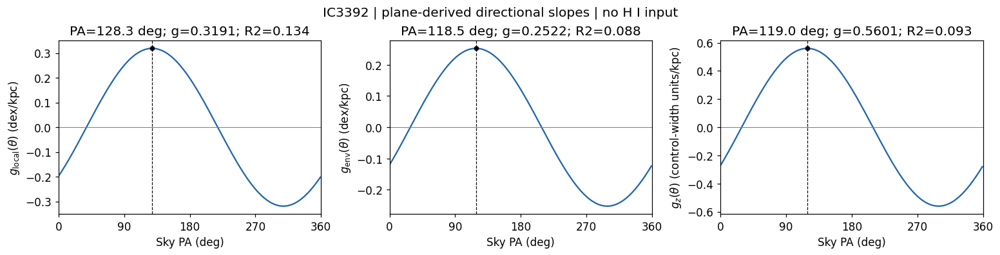

**IC3392:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

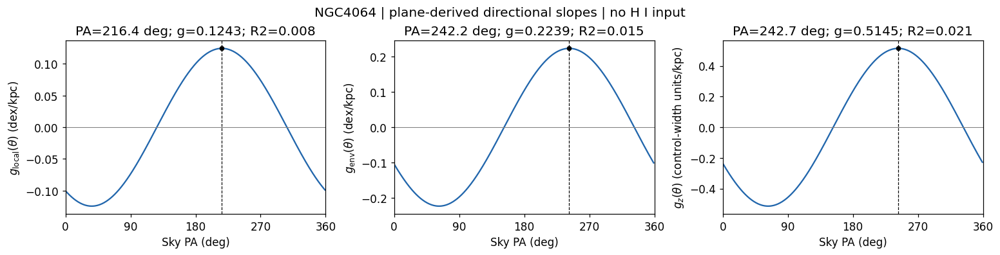

**NGC4064:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

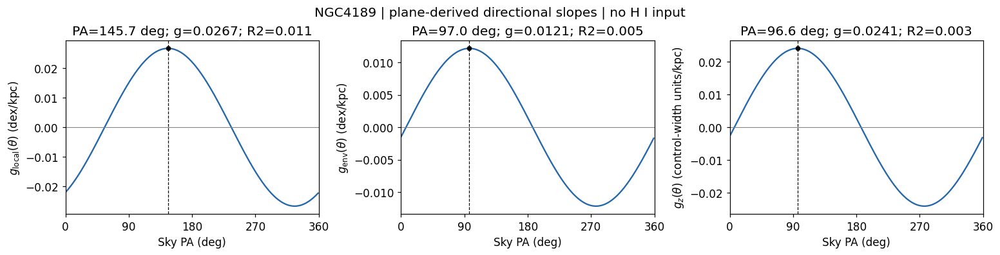

**NGC4189:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

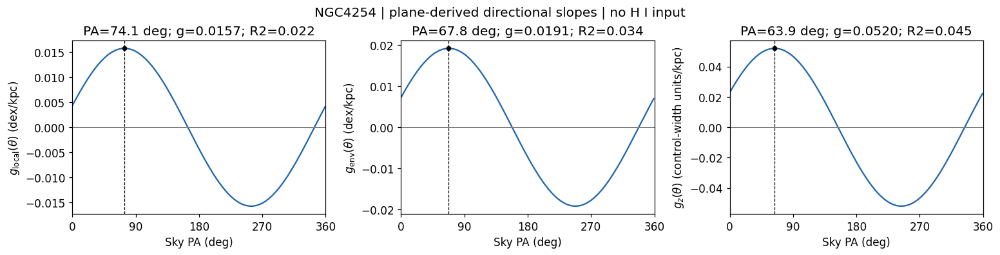

**NGC4254:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

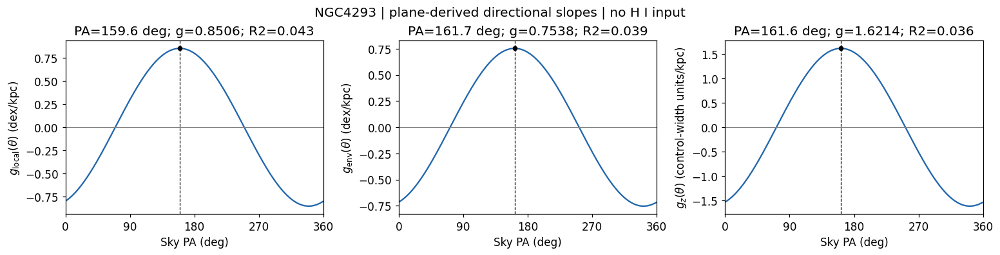

**NGC4293:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

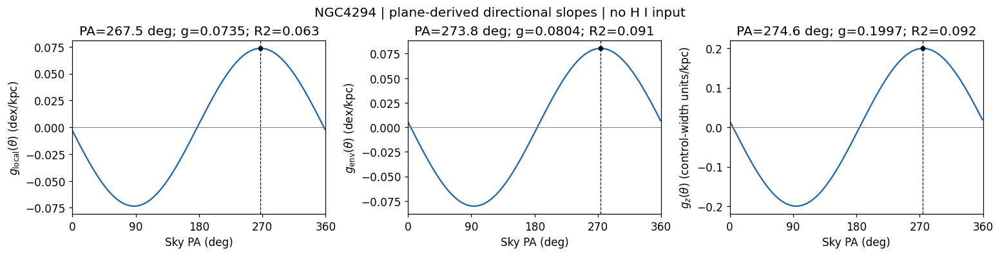

**NGC4294:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

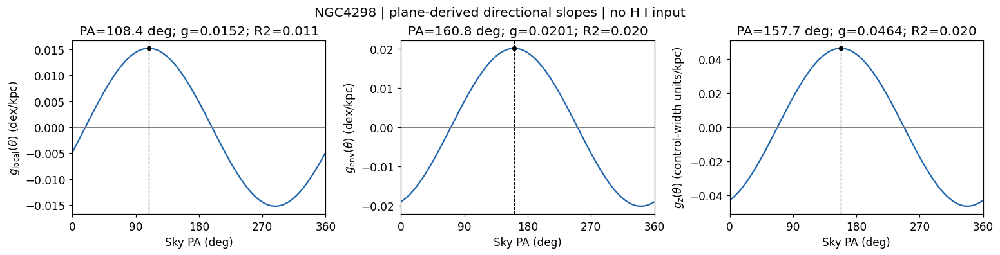

**NGC4298:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

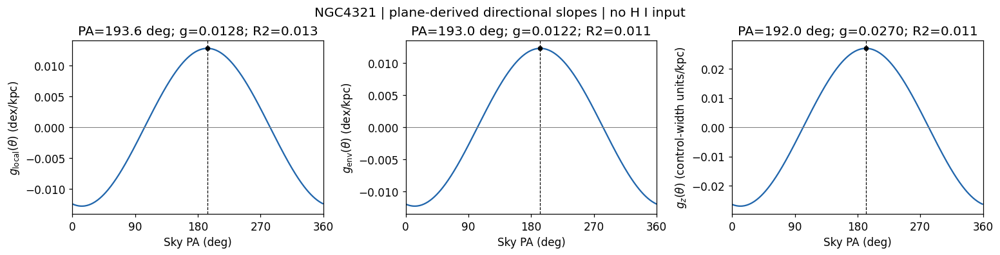

**NGC4321:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

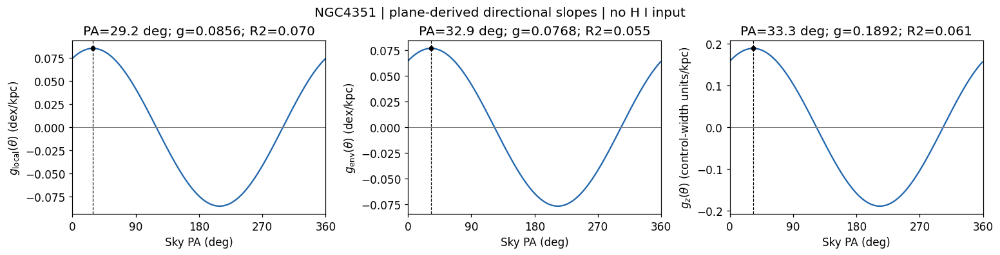

**NGC4351:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

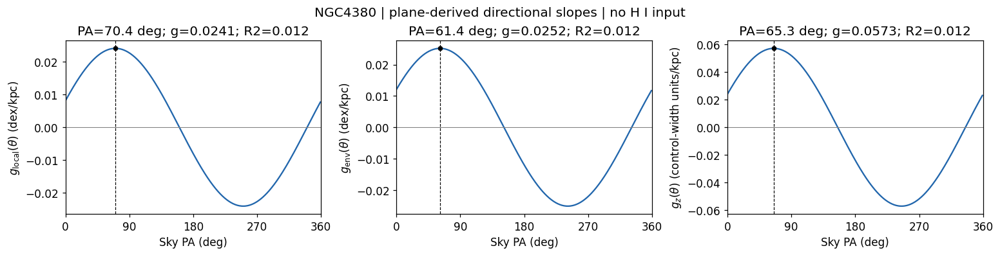

**NGC4380:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

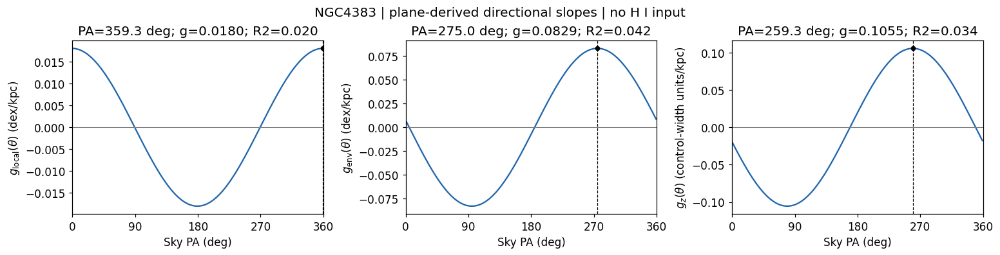

**NGC4383:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

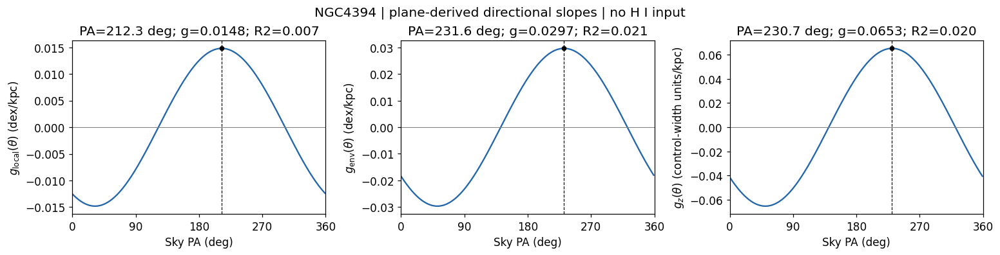

**NGC4394:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

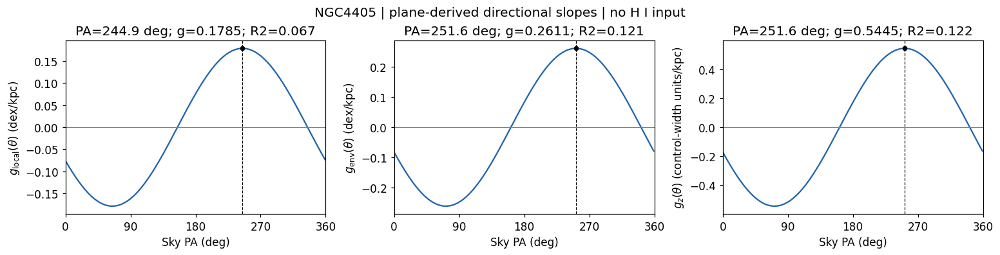

**NGC4405:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

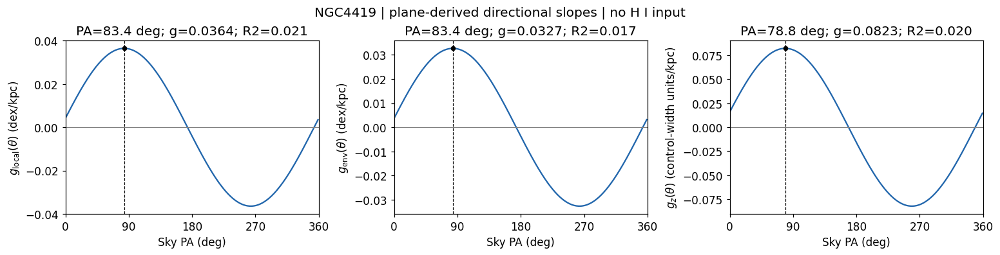

**NGC4419:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

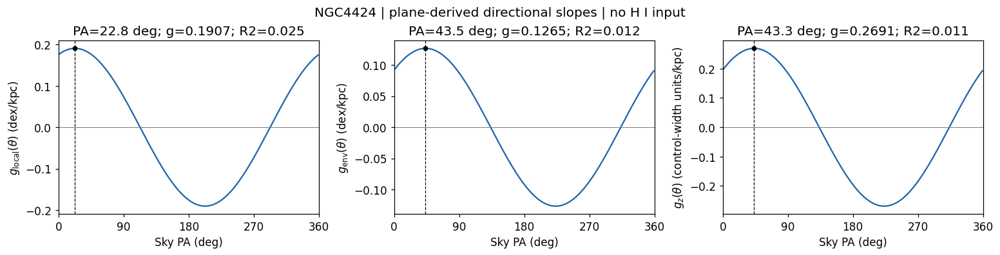

**NGC4424:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

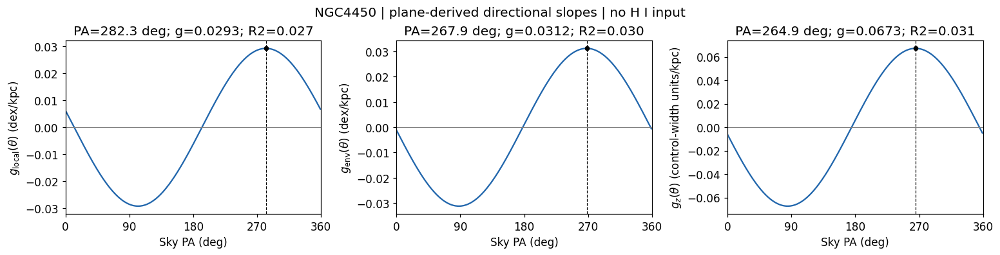

**NGC4450:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

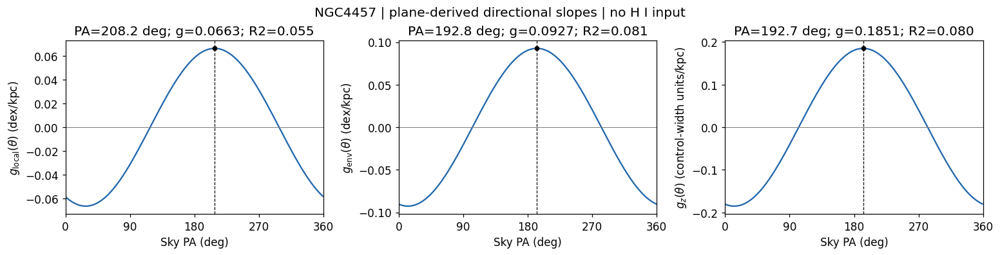

**NGC4457:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

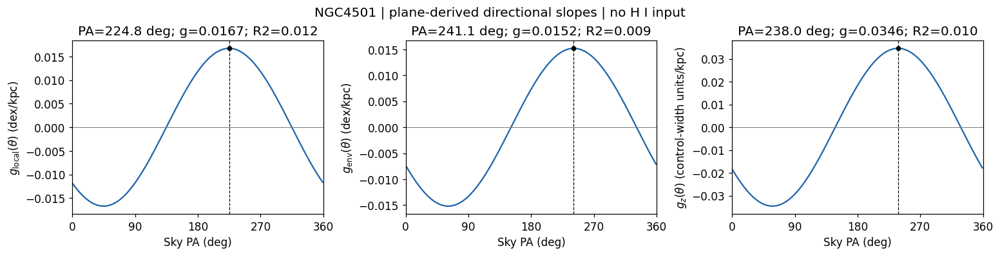

**NGC4501:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

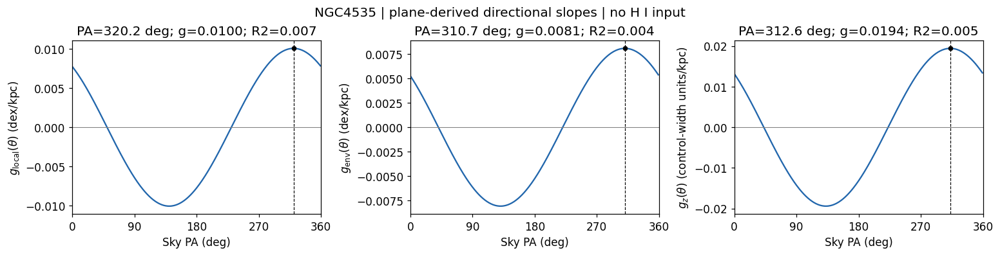

**NGC4535:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

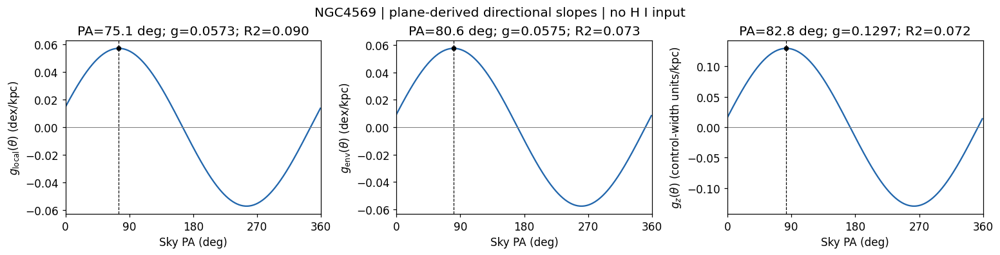

**NGC4569:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

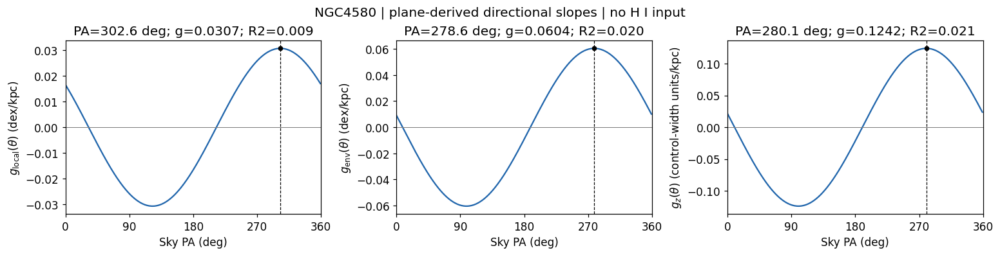

**NGC4580:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

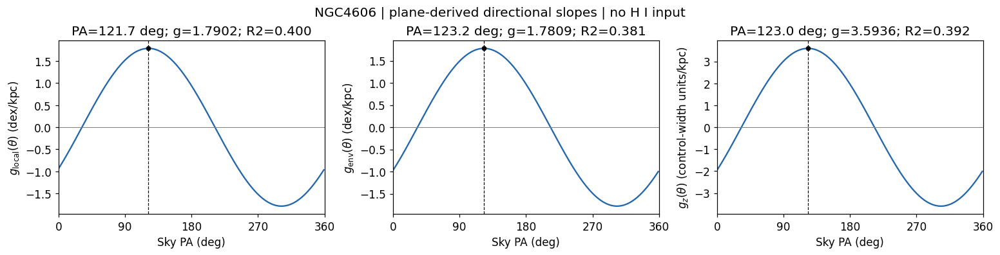

**NGC4606:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

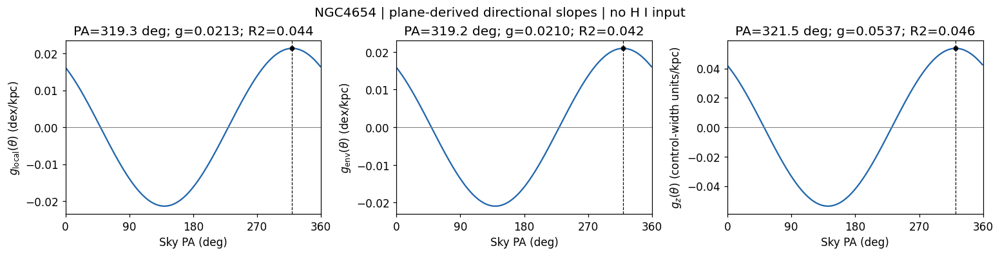

**NGC4654:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

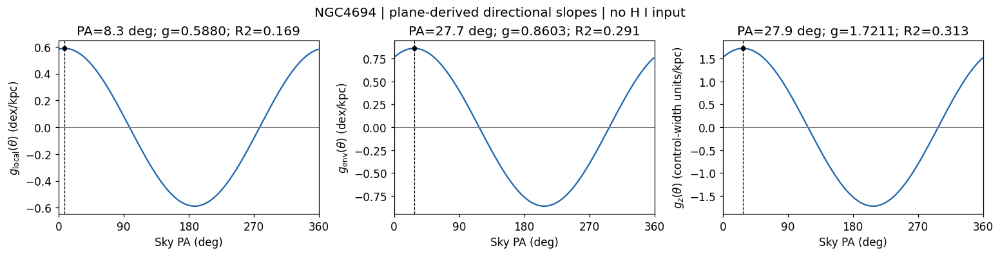

**NGC4694:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

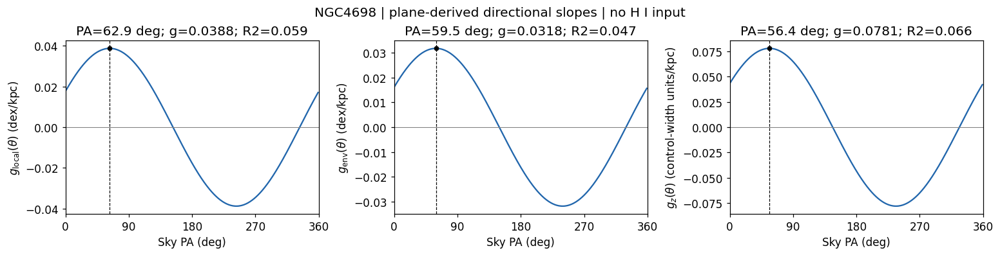

**NGC4698:** each curve is the derivative of a single fitted plane, not 360 separate regressions. Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.

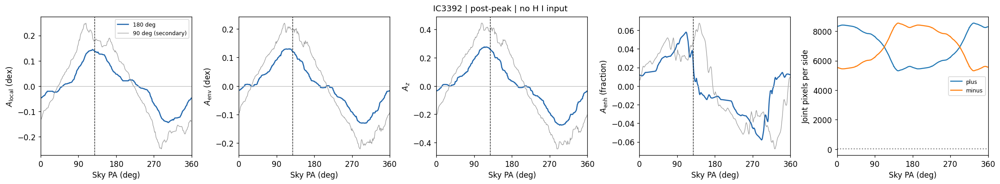

**IC3392:** black guides use the fixed local-gradient PA 128.3 deg, where the local hemisphere contrast is +0.138 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

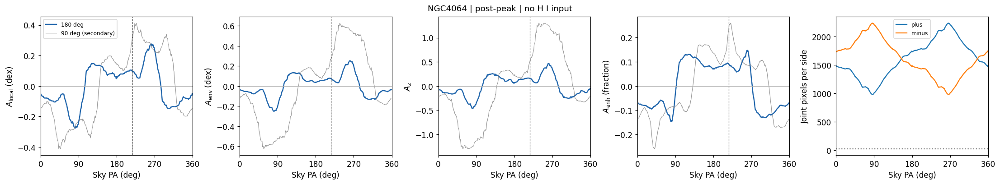

**NGC4064:** black guides use the fixed local-gradient PA 216.4 deg, where the local hemisphere contrast is +0.099 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

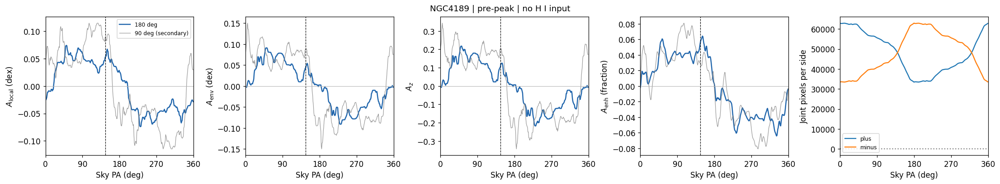

**NGC4189:** black guides use the fixed local-gradient PA 145.7 deg, where the local hemisphere contrast is +0.053 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

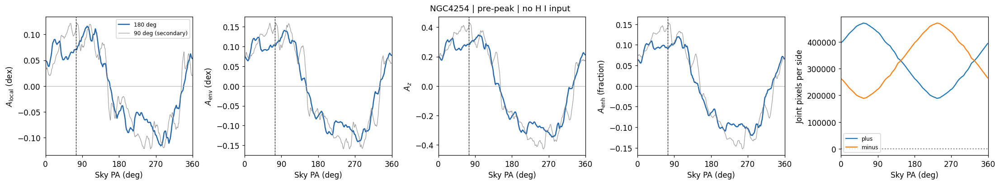

**NGC4254:** black guides use the fixed local-gradient PA 74.1 deg, where the local hemisphere contrast is +0.070 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

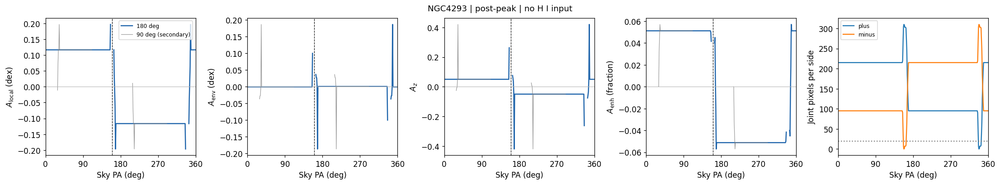

**NGC4293:** black guides use the fixed local-gradient PA 159.6 deg, where the local hemisphere contrast is +nan dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

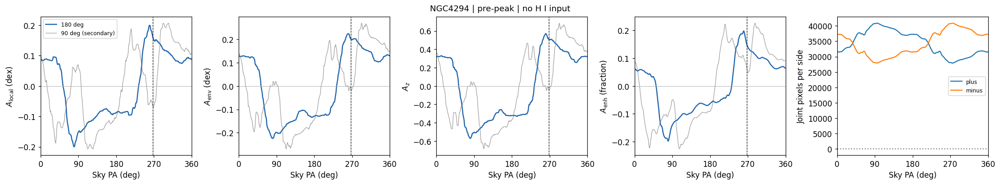

**NGC4294:** black guides use the fixed local-gradient PA 267.5 deg, where the local hemisphere contrast is +0.160 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

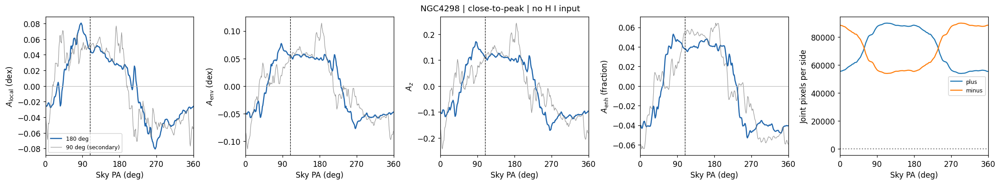

**NGC4298:** black guides use the fixed local-gradient PA 108.4 deg, where the local hemisphere contrast is +0.048 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

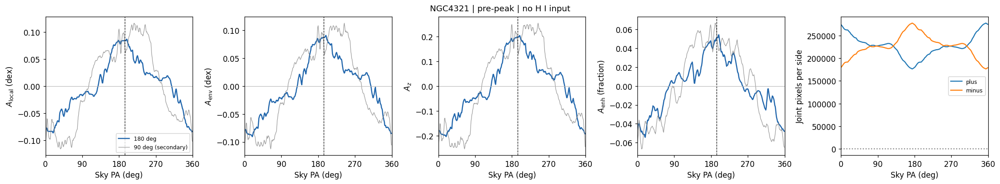

**NGC4321:** black guides use the fixed local-gradient PA 193.6 deg, where the local hemisphere contrast is +0.084 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

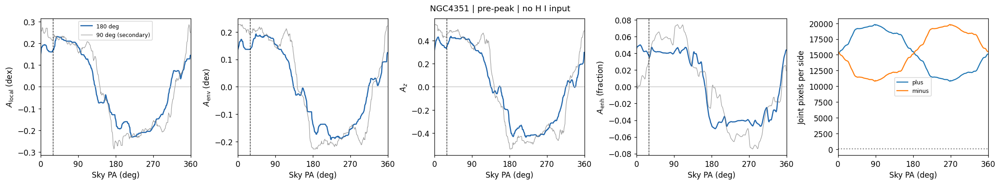

**NGC4351:** black guides use the fixed local-gradient PA 29.2 deg, where the local hemisphere contrast is +0.168 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

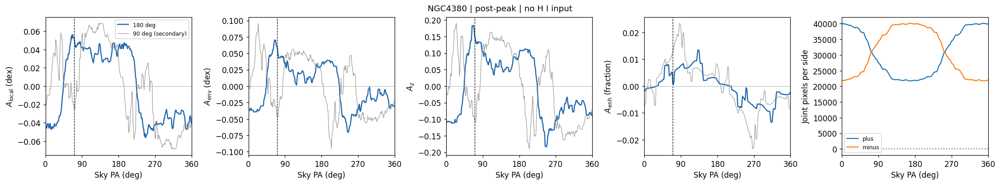

**NGC4380:** black guides use the fixed local-gradient PA 70.4 deg, where the local hemisphere contrast is +0.052 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

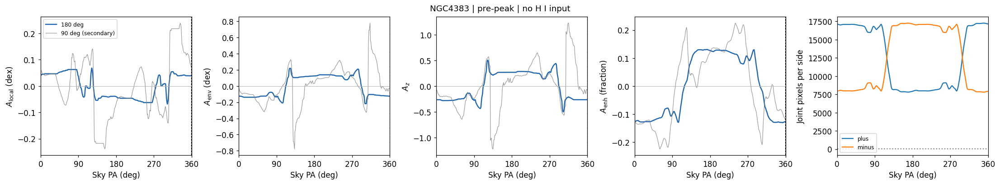

**NGC4383:** black guides use the fixed local-gradient PA 359.3 deg, where the local hemisphere contrast is +0.040 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

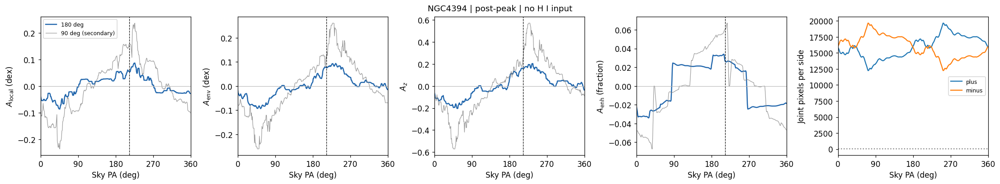

**NGC4394:** black guides use the fixed local-gradient PA 212.3 deg, where the local hemisphere contrast is +0.055 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

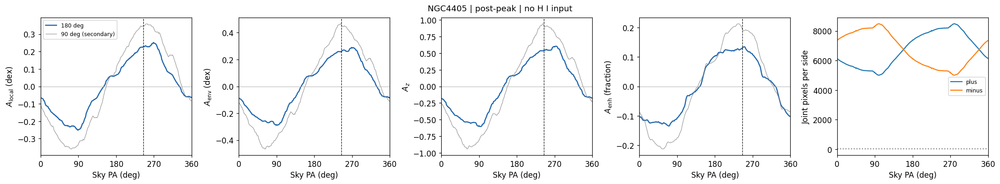

**NGC4405:** black guides use the fixed local-gradient PA 244.9 deg, where the local hemisphere contrast is +0.227 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

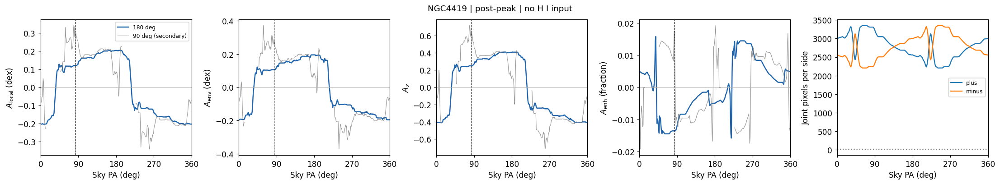

**NGC4419:** black guides use the fixed local-gradient PA 83.4 deg, where the local hemisphere contrast is +0.121 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

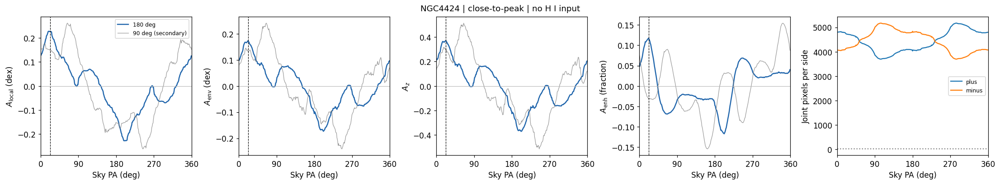

**NGC4424:** black guides use the fixed local-gradient PA 22.8 deg, where the local hemisphere contrast is +0.228 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

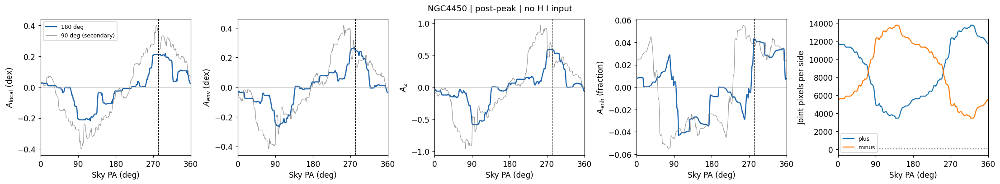

**NGC4450:** black guides use the fixed local-gradient PA 282.3 deg, where the local hemisphere contrast is +0.212 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

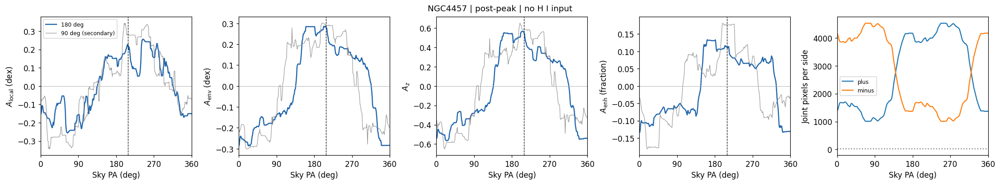

**NGC4457:** black guides use the fixed local-gradient PA 208.2 deg, where the local hemisphere contrast is +0.226 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

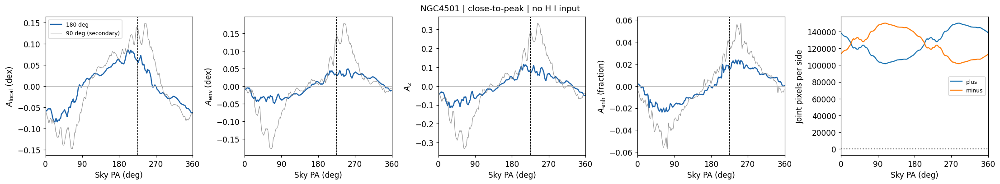

**NGC4501:** black guides use the fixed local-gradient PA 224.8 deg, where the local hemisphere contrast is +0.059 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

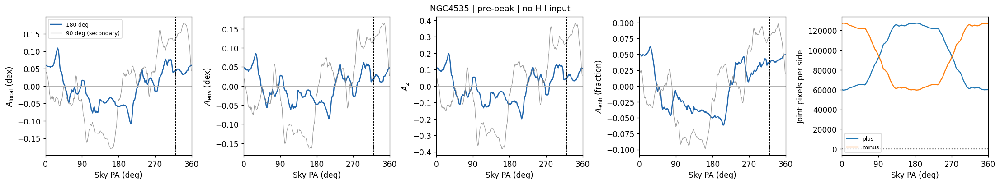

**NGC4535:** black guides use the fixed local-gradient PA 320.2 deg, where the local hemisphere contrast is +0.043 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

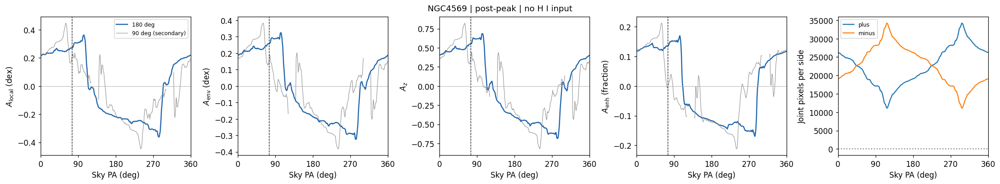

**NGC4569:** black guides use the fixed local-gradient PA 75.1 deg, where the local hemisphere contrast is +0.271 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

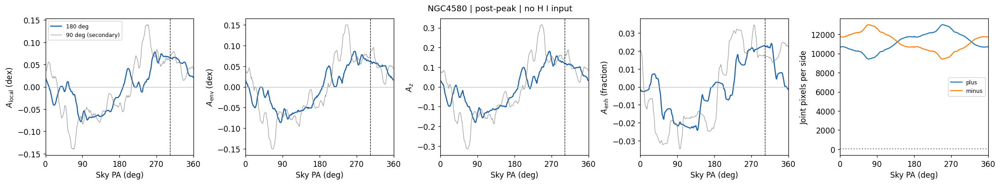

**NGC4580:** black guides use the fixed local-gradient PA 302.6 deg, where the local hemisphere contrast is +0.066 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

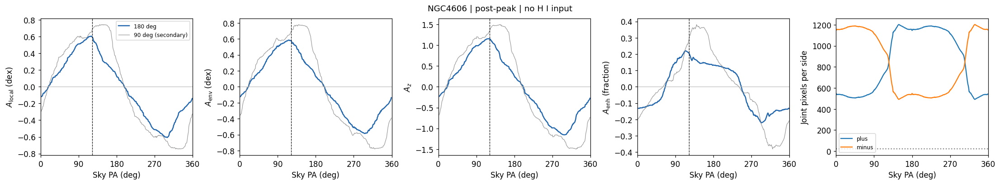

**NGC4606:** black guides use the fixed local-gradient PA 121.7 deg, where the local hemisphere contrast is +0.600 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

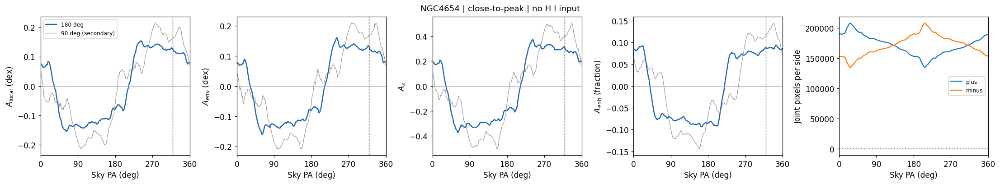

**NGC4654:** black guides use the fixed local-gradient PA 319.3 deg, where the local hemisphere contrast is +0.125 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

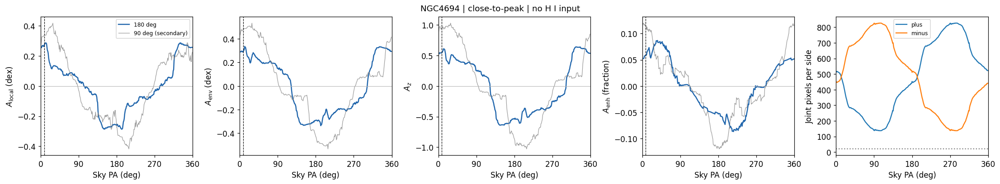

**NGC4694:** black guides use the fixed local-gradient PA 8.3 deg, where the local hemisphere contrast is +0.270 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

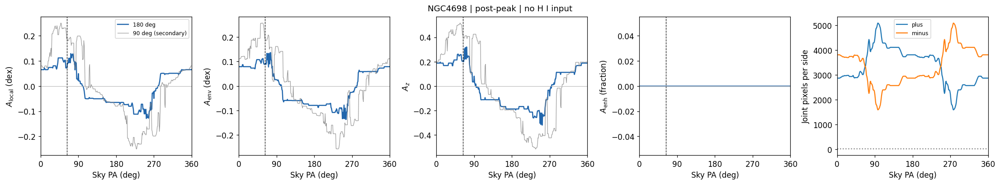

**NGC4698:** black guides use the fixed local-gradient PA 62.9 deg, where the local hemisphere contrast is +0.072 dex. The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. Their independently maximized angles do not replace the plane direction.

In [11]:

GRADIENT_LABELS={'local':r'$g_{\rm local}(\theta)$ (dex/kpc)',
    'env':r'$g_{\rm env}(\theta)$ (dex/kpc)','z':r'$g_z(\theta)$ (control-width units/kpc)'}
for galid,curves_g in gradient_curves.items():
    fig,axes=plt.subplots(1,3,figsize=(14,3.5),layout='constrained')
    for ax,metric in zip(axes,('local','env','z')):
        r=gradient_summary.loc[gradient_summary.GALID.eq(galid)&gradient_summary.metric.eq(metric)].iloc[0]
        ax.plot(PA_GRID,curves_g[metric],color='#2166ac')
        ax.axhline(0,color='0.5',lw=.7)
        if r.direction_defined:
            ax.axvline(r.theta_deg,color='black',ls='--',lw=.8)
            ax.plot(r.theta_deg,r.gradient_magnitude,'o',color='black',ms=4)
        ax.set(xlim=(0,360),xticks=[0,90,180,270,360],xlabel='Sky PA (deg)',ylabel=GRADIENT_LABELS[metric],
               title=f'PA={r.theta_deg:.1f} deg; g={r.gradient_magnitude:.4f}; R2={r.R2:.3f}')
    fig.suptitle(f'{galid} | plane-derived directional slopes | no H I input')
    plt.show()
    display(Markdown(f'**{galid}:** each curve is the derivative of a single fitted plane, not 360 separate regressions. '
        'Its sinusoidal shape is mathematical, not a goodness-of-fit claim. R2 measures the variance explained '
        'on the actual residual pixels; inspect the maps and hemisphere sensitivity as well.'))

for galid,curve in curves.items():
    fig,axes=plt.subplots(1,5,figsize=(20,3.6),layout='constrained')
    for ax,k in zip(axes[:4],METRICS):
        row=direction_summary.loc[direction_summary.GALID.eq(galid)&direction_summary.metric.eq(k)].iloc[0]
        ax.plot(PA_GRID,curve['A'][k],color='#2166ac',lw=1.6,label='180 deg')
        if galid in curves90:
            ax.plot(PA_GRID,curves90[galid]['A'][k],color='0.5',lw=.8,alpha=.8,label='90 deg (secondary)')
        primary_pa=preferred_sides.loc[preferred_sides.GALID.eq(galid),'theta_SF'].iloc[0]
        if np.isfinite(primary_pa):
            ax.axvline(primary_pa,color='black',ls='--',lw=.8)
        ax.axhline(0,color='0.7',lw=.7)
        ax.set(xlim=(0,360),xticks=[0,90,180,270,360],xlabel='Sky PA (deg)',ylabel=METRIC_LABELS[k])
    axes[0].legend(fontsize=8)
    axes[4].plot(PA_GRID,curve['counts'][:,0],label='plus')
    axes[4].plot(PA_GRID,curve['counts'][:,1],label='minus')
    axes[4].axhline(MIN_SIDE_PIXELS,color='0.5',ls=':')
    axes[4].set(xlim=(0,360),xticks=[0,90,180,270,360],xlabel='Sky PA (deg)',ylabel='Joint pixels per side')
    axes[4].legend(fontsize=8)
    fig.suptitle(f'{galid} | {spatial[galid]["stage"]} | no H I input',fontsize=12)
    plt.show()

    p=preferred_sides.loc[preferred_sides.GALID.eq(galid)].iloc[0]
    display(Markdown(f'**{galid}:** black guides use the fixed local-gradient PA {p.theta_SF:.1f} deg, '
        f'where the local hemisphere contrast is {p.A_local_at_SF:+.3f} dex. '
        'The blue/grey curves remain hemisphere/90-degree-sector robustness diagnostics. '
        'Their independently maximized angles do not replace the plane direction.'))


## 9. Fit quality and uncertainty limits

Native spaxels have PSF, gas-bin and astrophysical correlations. Equal-area OLS
defines a descriptive gradient but does not make pixels independent. We do not
report naive OLS standard errors, gradient-detection p-values, or PA confidence
intervals. A correlation-aware spatial/block resampling scheme is future work;
the old optional hemisphere-max shuffle is not a gradient significance test.
Rank/conditioning checks only establish numerical identifiability. Low $R^2$,
small extent or sparse patchy coverage can make the global plane physically
unrepresentative even when its coefficients are numerically determined.

In [12]:
display(gradient_summary[['GALID','metric','N_pixels','fit_status','design_condition','east_span_kpc','north_span_kpc','RMSE','R2']])
print('No formal gradient significance or PA uncertainty has been computed.')

No formal gradient significance or PA uncertainty has been computed.


,GALID,metric,N_pixels,fit_status,design_condition,east_span_kpc,north_span_kpc,RMSE,R2
0,IC3392,local,13868,OK,2.651914,2.511811,2.783807,0.283138,0.134249
1,IC3392,env,13868,OK,2.651914,2.511811,2.783807,0.302008,0.088149
2,IC3392,z,13868,OK,2.651914,2.511811,2.783807,0.645856,0.093407
3,NGC4064,local,3213,OK,1.972039,1.375897,1.903858,0.480551,0.007905
4,NGC4064,env,3213,OK,1.972039,1.375897,1.903858,0.490916,0.015151
...,...,...,...,...,...,...,...,...,...
70,NGC4694,env,963,OK,1.687062,1.087923,0.959930,0.299168,0.290695
71,NGC4694,z,963,OK,1.687062,1.087923,0.959930,0.567364,0.313161
72,NGC4698,local,6690,OK,3.792722,6.047649,12.719050,0.256195,0.058771
73,NGC4698,env,6690,OK,3.792722,6.047649,12.719050,0.259832,0.047417


## 10. Gradient strength and fixed-direction hemisphere contrast by stage

Each point is one single-centre galaxy with a numerically valid local gradient.
The second panel additionally needs supported hemispheres at that gradient PA.
Galaxies receive equal weight in stage medians; 10,000 whole-galaxy resamples
give 16th--84th percentile intervals on those medians, not regression errors.
The gradient amplitude is in dex/kpc; the hemisphere contrast is in dex and
can be negative even along a positive plane gradient on a patchy footprint.

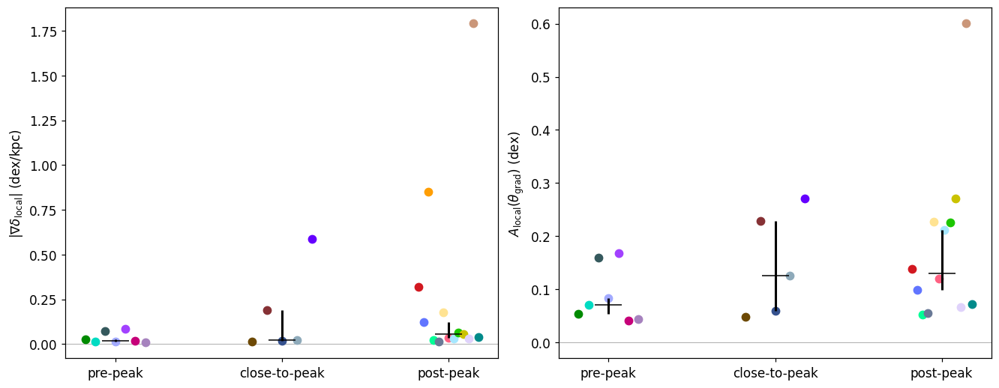

,metric,stage,Ngal,median,boot_p16,boot_p84
0,gradient_magnitude,pre-peak,7,0.018028,0.015730,0.026655
1,gradient_magnitude,close-to-peak,5,0.021338,0.016714,0.190696
2,gradient_magnitude,post-peak,13,0.057269,0.036440,0.124328
3,A_local_at_SF,pre-peak,7,0.070391,0.052951,0.083662
4,A_local_at_SF,close-to-peak,5,0.125050,0.059466,0.227945
5,A_local_at_SF,post-peak,12,0.129491,0.099163,0.211536


**Interpretation:** stage intervals resample whole galaxies. These descriptive trends may depend on footprint, spatial extent and patchiness; they are not calibrated gradient-detection tests.

In [13]:
galaxy_colors=load_galaxy_colors(GALAXY_COLOR_PATH)
stage_rows=[]
fig,axes=plt.subplots(1,2,figsize=(12,4.6),layout='constrained')
for ax,metric,label in zip(axes,('gradient_magnitude','A_local_at_SF'),
    (r'$|\nabla\delta_{\rm local}|$ (dex/kpc)',r'$A_{\rm local}(\theta_{\rm grad})$ (dex)')):
    for j,stage in enumerate(STAGE_ORDER):
        group=preferred_sides.loc[preferred_sides.stage.eq(stage)&preferred_sides.direction_defined
            &preferred_sides[metric].notna()].sort_values('GALID')
        vals=group[metric].to_numpy()
        if not len(vals):continue
        offsets=np.linspace(-.18,.18,len(vals)) if len(vals)>1 else [0]
        for offset,(_,row) in zip(offsets,group.iterrows()):
            ax.scatter(j+offset,row[metric],color=galaxy_colors[row.GALID],s=45,zorder=3)
        rng=np.random.default_rng(RANDOM_SEED+j)
        boots=np.median(rng.choice(vals,size=(N_BOOTSTRAP,len(vals)),replace=True),axis=1)
        lo,hi=np.percentile(boots,[16,84]);median=np.median(vals)
        ax.errorbar(j,median,yerr=[[median-lo],[hi-median]],fmt='k_',ms=24,lw=2,zorder=4)
        stage_rows.append(dict(metric=metric,stage=stage,Ngal=len(vals),median=median,boot_p16=lo,boot_p84=hi))
    ax.set(xticks=range(3),xticklabels=STAGE_ORDER,ylabel=label)
    ax.axhline(0,color='0.7',lw=.7)
plt.show()
stage_strength=pd.DataFrame(stage_rows)
display(stage_strength)
display(Markdown('**Interpretation:** stage intervals resample whole galaxies. These descriptive trends '
    'may depend on footprint, spatial extent and patchiness; they are not calibrated gradient-detection tests.'))

## 11. Introduce fixed VIVA compass sectors only after the MUSE result

The following pre-existing hypotheses are copied from the first-pass Q4 notebook
and were not adjusted to the new SF peaks. They come from
[Chung et al. (2009), Appendix A](https://arxiv.org/pdf/0909.0781),
[full atlas](https://www.astro.yale.edu/viva/papers/viva_atlas.pdf).
The +/-45 degree bracket is an analyst-selected coarse directional tolerance,
**not a published measurement error or a Gaussian confidence interval**.

| Galaxy | Coarse H I information | Expected compression side | Caveat |
|---|---|---|---|
| NGC4298 | NW diffuse extension, opposite sharp edge | SE (135 deg) | Companion / tidal ambiguity |
| NGC4424 | Southern tail, curving SE | N (0 deg) | Merger/collision, curved tail |
| NGC4501 | SW compressed edge | SW (225 deg) | SW/SE wording conflict in Chung |
| NGC4654 | SE tail, NW compression | NW (315 deg) | Mixed gravitational and ram-pressure effects |
| NGC4694 | H I connection to VCC2062 | Unassigned | Accretion/interaction; no adopted RPS direction |

NGC4501's SW choice is corroborated by the H I description in
[Vollmer et al. (2008)](https://arxiv.org/abs/0801.4874); we retain the current
MAUVE stage rather than substituting that paper's stage terminology.
Metadata explicitly distinguish a tail PA from a compression PA:
$\theta_{\rm RPS}=(\theta_{\rm tail}+180)\bmod360$, while compression PAs are used directly.
Other stages remain available for MUSE asymmetry analysis without invented H I angles.

In [14]:
VIVA_ROWS = [
    dict(GALID='NGC4298',compass='SE',pa_kind='compression',caveat='Companion / tidal ambiguity'),
    dict(GALID='NGC4424',compass='S',pa_kind='tail',caveat='Curved tail; merger/collision'),
    dict(GALID='NGC4501',compass='SW',pa_kind='compression',caveat='Chung SW/SE conflict; Vollmer 2008 SW corroboration'),
    dict(GALID='NGC4654',compass='NW',pa_kind='compression',caveat='Mixed tides and ram pressure'),
]
COMPASS_PA={'N':0.,'NE':45.,'E':90.,'SE':135.,'S':180.,'SW':225.,'W':270.,'NW':315.}
viva=pd.DataFrame(VIVA_ROWS)
assert not viva.GALID.duplicated().any()
assert set(viva.pa_kind) <= {'compression','tail'}
viva['pa_input_deg']=viva.compass.map(COMPASS_PA)
assert viva.pa_input_deg.notna().all()
viva['pa_RPS_deg']=(viva.pa_input_deg+np.where(viva.pa_kind.eq('tail'),180.,0.))%360
viva['half_width_deg']=45.
viva['reference']='Chung et al. 2009 Appendix A; https://arxiv.org/pdf/0909.0781'
viva.loc[viva.GALID.eq('NGC4501'),'reference']+='; https://arxiv.org/abs/0801.4874'
VIVA_SHA256=hashlib.sha256(viva.to_json(orient='records').encode()).hexdigest()
assert hashlib.sha256(direction_summary.to_json(orient='records').encode()).hexdigest()==INFERENCE_SHA256
display(viva)
print('Frozen VIVA metadata checksum:',VIVA_SHA256)
assert hashlib.sha256(gradient_summary.to_json(orient="records").encode()).hexdigest()==GRADIENT_INFERENCE_SHA256
assert hashlib.sha256(preferred_sides.to_json(orient="records").encode()).hexdigest()==GRADIENT_SIDES_SHA256


Frozen VIVA metadata checksum: 96fb9d474cfd582b9720c06db6996b86286b7a0fa6d34c1eba56c3a7f7700790


,GALID,compass,pa_kind,caveat,pa_input_deg,pa_RPS_deg,half_width_deg,reference
0,NGC4298,SE,compression,Companion / tidal ambiguity,135.0,135.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...
1,NGC4424,S,tail,Curved tail; merger/collision,180.0,0.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...
2,NGC4501,SW,compression,Chung SW/SE conflict; Vollmer 2008 SW corrobor...,225.0,225.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...
3,NGC4654,NW,compression,Mixed tides and ram pressure,315.0,315.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...


## 12. Compare the continuous local-gradient PA with fixed VIVA sectors

Directed separation is $|((\theta_{\rm SF}-\theta_{\rm RPS}+180)\bmod360)-180|$;
consistency is $\Delta\theta\le45$ degrees. The alignment sample requires a sourced
H I angle and a numerically valid, nonzero local gradient. Hemisphere support is
reported independently: insufficient sides withhold physical side classification,
but do not erase an otherwise identifiable plane direction. H I does not enter any fit.

Environmental medians and enhanced fractions refer to hemispheres at the **continuous
gradient PA**, evaluated directly from pixels. A positive fitted slope does not
guarantee a positive median contrast, and neither alone establishes absolute
enhancement. Above-control and less-suppressed statements remain descriptive.

In [15]:

alignment=preferred_sides.merge(viva,on='GALID',how='left',validate='one_to_one')
alignment['delta_theta_deg']=angle_distance(alignment.theta_SF,alignment.pa_RPS_deg)
alignment['testable']=alignment.pa_RPS_deg.notna()&alignment.direction_defined&alignment.fit_ok
alignment['aligned']=pd.Series(pd.NA,index=alignment.index,dtype='boolean')
alignment.loc[alignment.testable,'aligned']=alignment.loc[alignment.testable,'delta_theta_deg'].le(45)
def environmental_state(row):
    plus,minus=row.env_plus,row.env_minus
    if not np.isfinite(plus+minus): return 'unavailable'
    if plus>0 and plus>minus: return 'above control on SF-preferred side; positive environmental contrast'
    if plus>0: return 'above control, but not the environmentally stronger side'
    if plus<0 and plus>minus: return 'less suppressed on SF-preferred side; still below control'
    if plus<0: return 'below control; local and environmental preference differ'
    return 'median exactly at control; no inference of equivalence'


alignment['environmental_state']=alignment.apply(environmental_state,axis=1)
alignment['exclusion_reason']=alignment.apply(lambda r:
    'no independent coarse H I direction' if pd.isna(r.pa_RPS_deg) else
    r.fit_status if not r.fit_ok else 'zero / undefined gradient' if not r.direction_defined else '',axis=1)
display(alignment[['GALID','stage','theta_SF','gradient_magnitude','pa_RPS_deg','delta_theta_deg','testable','aligned',
    'side_supported','N_plus','N_minus','env_plus','env_minus','enh_plus','enh_minus','environmental_state','exclusion_reason']])
alignment_by_metric=gradient_summary.merge(viva[['GALID','pa_RPS_deg']],on='GALID',how='left')
alignment_by_metric['delta_theta_deg']=angle_distance(alignment_by_metric.theta_deg,alignment_by_metric.pa_RPS_deg)
display(alignment_by_metric.loc[alignment_by_metric.pa_RPS_deg.notna(),
    ['GALID','metric','theta_deg','gradient_magnitude','delta_theta_deg','fit_status']])


,GALID,stage,theta_SF,gradient_magnitude,pa_RPS_deg,delta_theta_deg,testable,aligned,side_supported,N_plus,N_minus,env_plus,env_minus,enh_plus,enh_minus,environmental_state,exclusion_reason
0,IC3392,post-peak,128.305593,0.319067,NaN,NaN,False,<NA>,True,6034,7834,-0.049545,-0.169400,0.067617,0.043784,less suppressed on SF-preferred side; still be...,no independent coarse H I direction
1,NGC4064,post-peak,216.388514,0.124328,NaN,NaN,False,<NA>,True,1818,1395,0.142411,0.069806,0.249175,0.159140,above control on SF-preferred side; positive e...,no independent coarse H I direction
2,NGC4189,pre-peak,145.704652,0.026655,NaN,NaN,False,<NA>,True,45518,50839,0.022414,-0.020363,0.211784,0.155983,above control on SF-preferred side; positive e...,no independent coarse H I direction
3,NGC4254,pre-peak,74.060706,0.015730,NaN,NaN,False,<NA>,True,455185,203688,0.276229,0.173391,0.391144,0.298957,above control on SF-preferred side; positive e...,no independent coarse H I direction
4,NGC4293,post-peak,159.566171,0.850577,NaN,NaN,False,<NA>,False,305,5,NaN,NaN,NaN,NaN,unavailable,no independent coarse H I direction
5,NGC4294,pre-peak,267.533766,0.073481,NaN,NaN,False,<NA>,True,28080,40718,0.219424,0.018722,0.324252,0.174640,above control on SF-preferred side; positive e...,no independent coarse H I direction
6,NGC4298,close-to-peak,108.440560,0.015217,135.0,26.559440,True,True,True,89901,54219,-0.114928,-0.170825,0.116406,0.078718,less suppressed on SF-preferred side; still be...,
7,NGC4321,pre-peak,193.572465,0.012807,NaN,NaN,False,<NA>,True,191634,262476,0.034090,-0.052850,0.211967,0.161059,above control on SF-preferred side; positive e...,no independent coarse H I direction
8,NGC4351,pre-peak,29.217403,0.085596,NaN,NaN,False,<NA>,True,17413,13200,-0.122981,-0.259382,0.087349,0.049848,less suppressed on SF-preferred side; still be...,no independent coarse H I direction
9,NGC4380,post-peak,70.394758,0.024062,NaN,NaN,False,<NA>,True,31539,30286,-0.506298,-0.566797,0.010432,0.010005,less suppressed on SF-preferred side; still be...,no independent coarse H I direction


,GALID,metric,theta_deg,gradient_magnitude,delta_theta_deg,fit_status
18,NGC4298,local,108.440560,0.015217,26.559440,OK
19,NGC4298,env,160.766190,0.020139,25.766190,OK
20,NGC4298,z,157.749775,0.046415,22.749775,OK
42,NGC4424,local,22.793956,0.190696,22.793956,OK
43,NGC4424,env,43.508551,0.126474,43.508551,OK
44,NGC4424,z,43.320375,0.269124,43.320375,OK
51,NGC4501,local,224.762799,0.016714,0.237201,OK
52,NGC4501,env,241.090496,0.015187,16.090496,OK
53,NGC4501,z,238.017498,0.034618,13.017498,OK
66,NGC4654,local,319.331150,0.021338,4.331150,OK


## 13. Close-to-peak polar gradient comparison: east left, west right

The curve is the directional derivative of the fitted plane, not a map of
galactocentric radius. We plot $r_{\rm plot}=r_0+g(\theta)$ so radii stay positive.
The dotted circle is **zero slope**: along that PA the fitted plane has no first-order
change. Outside means an increasing residual; inside means decreasing.
It is not a physical ring, effective radius, significance threshold or zero
environmental residual. The original hemisphere notebook instead uses this circle
for **zero contrast (equal sides)**. Radial ticks label original signed units.

All three residual planes are shown, each with its own gradient ray. The local
gradient remains the predeclared primary SF direction. The amber wedge is the
fixed VIVA compression direction +/-45 degrees, not an SF-angle uncertainty.

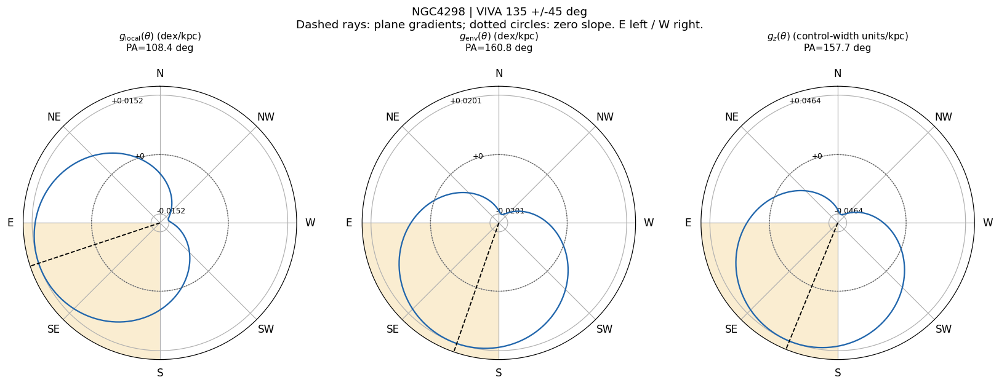

**NGC4298:** Local-gradient separation 26.6 deg; inside fixed VIVA sector. less suppressed on SF-preferred side; still below control. These sinusoidal curves are fitted derivatives, not evidence by themselves of coherent raw-map structure. The environmental and standardized gradients are correlated checks, not independent detections.

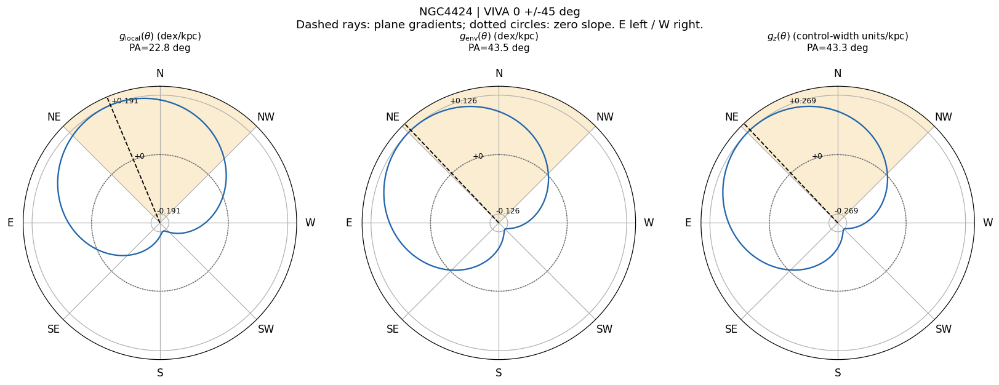

**NGC4424:** Local-gradient separation 22.8 deg; inside fixed VIVA sector. above control on SF-preferred side; positive environmental contrast. These sinusoidal curves are fitted derivatives, not evidence by themselves of coherent raw-map structure. The environmental and standardized gradients are correlated checks, not independent detections.

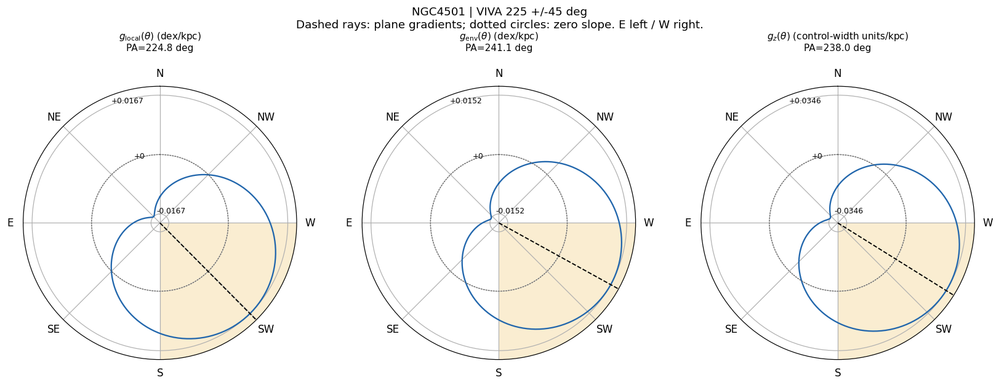

**NGC4501:** Local-gradient separation 0.2 deg; inside fixed VIVA sector. less suppressed on SF-preferred side; still below control. These sinusoidal curves are fitted derivatives, not evidence by themselves of coherent raw-map structure. The environmental and standardized gradients are correlated checks, not independent detections.

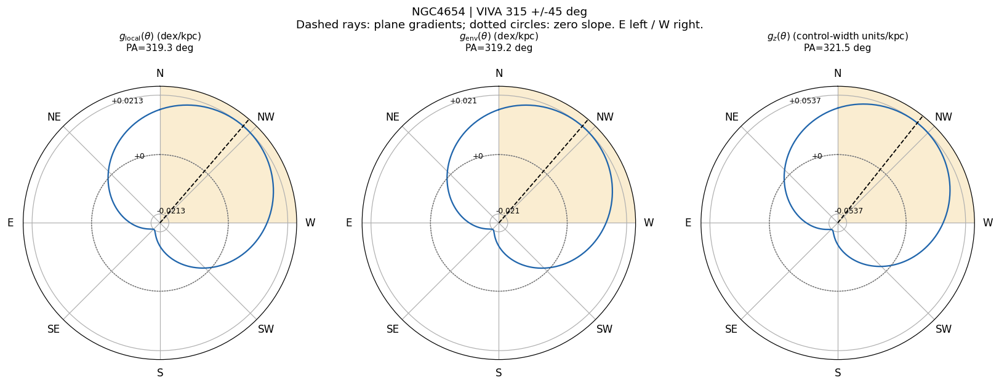

**NGC4654:** Local-gradient separation 4.3 deg; inside fixed VIVA sector. above control on SF-preferred side; positive environmental contrast. These sinusoidal curves are fitted derivatives, not evidence by themselves of coherent raw-map structure. The environmental and standardized gradients are correlated checks, not independent detections.

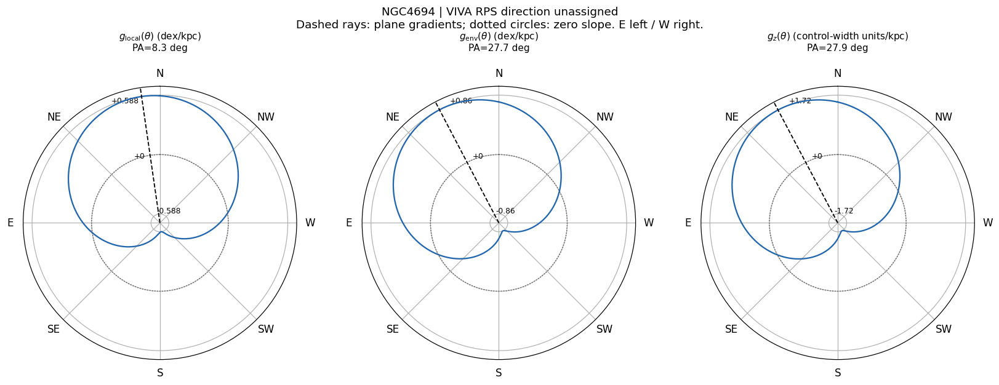

**NGC4694:** no independent coarse H I direction. less suppressed on SF-preferred side; still below control. These sinusoidal curves are fitted derivatives, not evidence by themselves of coherent raw-map structure. The environmental and standardized gradients are correlated checks, not independent detections.

In [16]:
def polar_gradient(ax,galid,metric,hi):
    curve=gradient_curves[galid][metric]
    r=gradient_summary.loc[gradient_summary.GALID.eq(galid)&gradient_summary.metric.eq(metric)].iloc[0]
    if not np.isfinite(curve).any():
        ax.set_title('Plane unavailable');return
    scale=max(float(r.gradient_magnitude),1e-6);baseline=1.15*scale
    theta=np.deg2rad(np.r_[PA_GRID,360])
    ax.plot(theta,baseline+np.r_[curve,curve[0]],color='#2166ac')
    ax.plot(theta,np.full(len(theta),baseline),color='0.35',ls=':',lw=1)
    ticks=np.array([-scale,0,scale])
    ax.set_rticks(ticks+baseline);ax.set_yticklabels([f'{v:+.3g}' for v in ticks],fontsize=8)
    ax.set_ylim(0,baseline+1.15*scale)
    ax.set_theta_zero_location('N');ax.set_theta_direction(1)
    ax.set_thetagrids(np.arange(0,360,45),['N','NE','E','SE','S','SW','W','NW'])
    if r.direction_defined:ax.axvline(np.deg2rad(r.theta_deg),color='black',ls='--',lw=1.2)
    if pd.notna(hi):ax.bar(np.deg2rad(hi),baseline+1.15*scale,width=np.pi/2,bottom=0,
        color='#e69f00',alpha=.18,edgecolor='none',zorder=0)
    ax.set_title(GRADIENT_LABELS[metric]+f'\nPA={r.theta_deg:.1f} deg',pad=18,fontsize=10)

for galid in close_ids:
    if galid not in gradient_curves:continue
    row=alignment.loc[alignment.GALID.eq(galid)].iloc[0]
    fig,axes=plt.subplots(1,3,figsize=(15,5.5),subplot_kw={'projection':'polar'},layout='constrained')
    for ax,metric in zip(axes,('local','env','z')):polar_gradient(ax,galid,metric,row.pa_RPS_deg)
    hi=f'VIVA {row.pa_RPS_deg:.0f} +/-45 deg' if pd.notna(row.pa_RPS_deg) else 'VIVA RPS direction unassigned'
    fig.suptitle(f'{galid} | {hi}\nDashed rays: plane gradients; dotted circles: zero slope. E left / W right.',fontsize=12)
    plt.show()
    status=(f'Local-gradient separation {row.delta_theta_deg:.1f} deg; '
        +('inside' if bool(row.aligned) else 'outside')+' fixed VIVA sector') if row.testable else row.exclusion_reason
    display(Markdown(f'**{galid}:** {status}. {row.environmental_state}. '
        'These sinusoidal curves are fitted derivatives, not evidence by themselves of coherent raw-map structure. '
        'The environmental and standardized gradients are correlated checks, not independent detections.'))


## Close-to-peak five-panel maps after direction inference

Repeat the five map panels with **north up, east left, west right**. Cyan arrows
show the inferred SF direction. The thin amber arrow and translucent amber
sector show the independent VIVA compression PA and its fixed +/-45-degree
tolerance. The same primary SF angle is drawn on every panel; it is not refitted
to each panel. A cyan arrow's length is only a display guide, not an amplitude.
The VIVA wedge is a sky-angle overlay, not a fitted contour or a mask used in inference.
Original MUSE-only maps remain above, so H I is introduced only after inference.
NGC4694 has no adopted H I sector and receives no invented amber arrow/wedge.


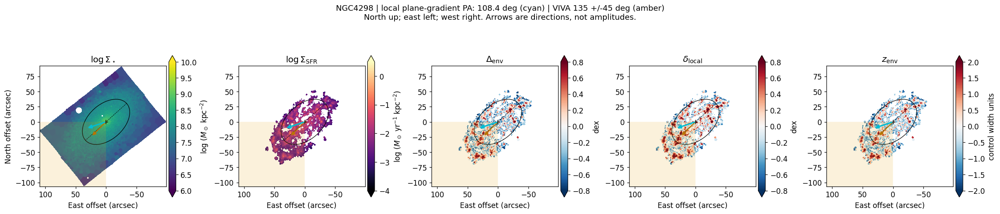

**NGC4298:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: -0.115/-0.171 dex. less suppressed on SF-preferred side; still below control. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

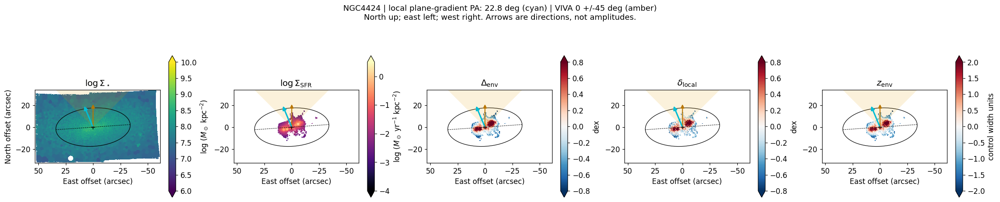

**NGC4424:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: +0.059/-0.115 dex. above control on SF-preferred side; positive environmental contrast. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

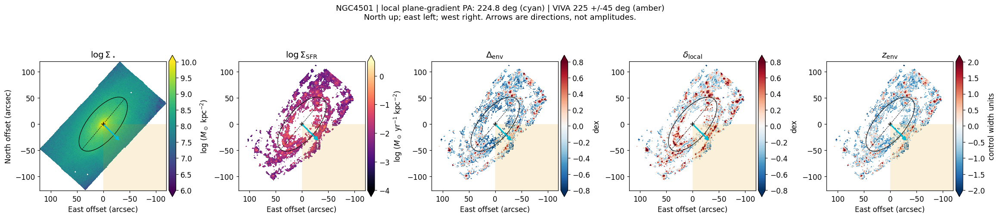

**NGC4501:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: -0.227/-0.258 dex. less suppressed on SF-preferred side; still below control. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

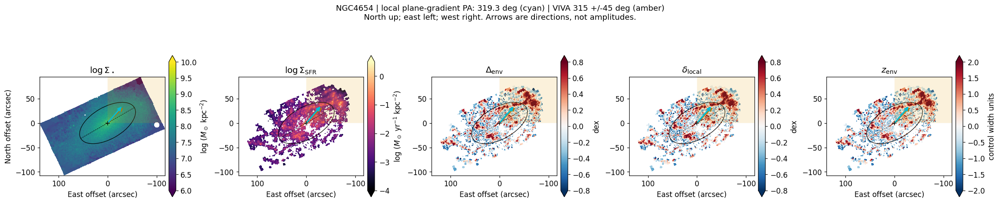

**NGC4654:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: +0.035/-0.096 dex. above control on SF-preferred side; positive environmental contrast. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

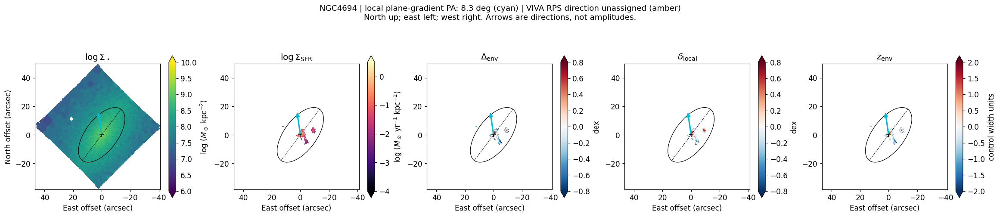

**NGC4694:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: -0.036/-0.334 dex. less suppressed on SF-preferred side; still below control. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

In [17]:
SF_ESTIMATOR_LABEL = 'local plane-gradient PA'

from matplotlib.patches import Polygon
from matplotlib.lines import Line2D

def pa_vector(pa_deg,length):
    theta=np.deg2rad(pa_deg)
    return np.array([length*np.sin(theta),length*np.cos(theta)])

def add_sky_directions(ax,m,theta_sf,theta_hi):
    # Positive E remains the data coordinate; inverted x axis puts E on the left.
    xlim,ylim=ax.get_xlim(),ax.get_ylim()
    radius=1.1*np.hypot(max(abs(np.asarray(xlim))),max(abs(np.asarray(ylim))))
    comp=m['components'].iloc[0]
    length=min(.75*comp.a_re_arcsec,.65*min(max(abs(np.asarray(xlim))),max(abs(np.asarray(ylim)))))
    if np.isfinite(theta_hi):
        angles=np.linspace(theta_hi-45,theta_hi+45,181)
        arc=np.column_stack([radius*np.sin(np.deg2rad(angles)),radius*np.cos(np.deg2rad(angles))])
        ax.add_patch(Polygon(np.vstack([[0,0],arc,[0,0]]),closed=True,facecolor='#e69f00',
            edgecolor='none',alpha=.14,zorder=2))
        v=pa_vector(theta_hi,length)
        ax.annotate('',xy=v,xytext=(0,0),arrowprops=dict(arrowstyle='-|>',lw=1.4,color='#b87500'),zorder=5)
    if np.isfinite(theta_sf):
        v=pa_vector(theta_sf,length)
        ax.annotate('',xy=v,xytext=(0,0),arrowprops=dict(arrowstyle='-|>',lw=2.1,color='#00bcd4'),zorder=6)
    ax.set_xlim(xlim);ax.set_ylim(ylim)
    assert ax.xaxis_inverted()

for galid in close_ids:
    if galid not in curves: continue
    m=spatial[galid]
    row=alignment.loc[alignment.GALID.eq(galid)].iloc[0]
    panels=[np.where(m['valid_disc_mask'],m['log_sigma_star'],np.nan),
            np.where(m['sf_mask'],m['log_sigma_sfr'],np.nan),m['delta_env'],m['delta_local'],m['z_env']]
    labels=[r'$\log\Sigma_\star$',r'$\log\Sigma_{\rm SFR}$',r'$\Delta_{\rm env}$',r'$\delta_{\rm local}$',r'$z_{\rm env}$']
    ranges=[(6,10),(-4,.5),(-RESIDUAL_VLIM,RESIDUAL_VLIM),(-RESIDUAL_VLIM,RESIDUAL_VLIM),(-Z_VLIM,Z_VLIM)]
    units=[r'log ($M_\odot$ kpc$^{-2}$)',r'log ($M_\odot$ yr$^{-1}$ kpc$^{-2}$)','dex','dex','control width units']
    fig,axes=plt.subplots(1,5,figsize=(21,4.8),layout='constrained')
    for ax,data,label,limits,cmap,unit in zip(axes,panels,labels,ranges,
            ['viridis','magma','RdBu_r','RdBu_r','RdBu_r'],units):
        im=ax.pcolormesh(m['east'],m['north'],np.ma.masked_invalid(data),shading='nearest',
            cmap=cmap,vmin=limits[0],vmax=limits[1],rasterized=True)
        decorate_blind_map(ax,m)
        add_sky_directions(ax,m,row.theta_SF,row.pa_RPS_deg)
        ax.set_title(label)
        fig.colorbar(im,ax=ax,shrink=.7,pad=.02,extend='both',label=unit)
    axes[0].set_ylabel('North offset (arcsec)')
    hi_label=f'VIVA {row.pa_RPS_deg:.0f} +/-45 deg' if np.isfinite(row.pa_RPS_deg) else 'VIVA RPS direction unassigned'
    fig.suptitle(f'{galid} | {SF_ESTIMATOR_LABEL}: {row.theta_SF:.1f} deg (cyan) | {hi_label} (amber)\n'
                 'North up; east left; west right. Arrows are directions, not amplitudes.',fontsize=12)
    plt.show()
    display(Markdown(f'**{galid}:** the same independently inferred SF PA is overlaid on all five panels. '
        f'Preferred/opposite environmental medians: {row.env_plus:+.3f}/{row.env_minus:+.3f} dex. '
        f'{row.environmental_state}. The amber sector is only the fixed external comparison; '
        'no pixels were selected or weighted by H I orientation.'))


## 14. Alignment count and hemisphere robustness at the fixed gradient PA

The one-sided binomial tail uses the idealized uniform directed-angle expectation
$p_0=90/360=0.25$ for the close-to-peak sample. It is an illustrative benchmark,
not a calibrated detection probability under shared geometry/footprint biases.
The robustness table evaluates 180- and 90-degree side contrasts at the same
continuous gradient PA and records the separately maximized hemisphere angle only
for comparison. No alternate metric or sector is selected to improve alignment.

In [18]:
testable=alignment.loc[alignment.stage.eq('close-to-peak')&alignment.testable]
N=len(testable);k=int(testable.aligned.sum())
p_binomial=binomtest(k,N,p=.25,alternative='greater').pvalue if N else np.nan
print(f'Primary plane-gradient alignment: {k}/{N}; idealized binomial tail={p_binomial:.5g}')
display(alignment.loc[alignment.stage.eq('close-to-peak')&~alignment.testable,['GALID','exclusion_reason']])
sector_rows=[]
for galid,d in direction_inputs.items():
    primary=preferred_sides.loc[preferred_sides.GALID.eq(galid)].iloc[0]
    ninety=sides_at_angle(d['pa'],d['values'],primary.theta_SF,width=90)
    old=hemisphere_preferred_sides.loc[hemisphere_preferred_sides.GALID.eq(galid)].iloc[0]
    sector_rows.append(dict(GALID=galid,theta_gradient=primary.theta_SF,theta_hemisphere_max=old.theta_SF,
        delta_gradient_hemisphere_deg=float(angle_distance(primary.theta_SF,old.theta_SF)),
        A_180_at_gradient=primary.A_local_at_SF,A_90_at_gradient=ninety['A_local_at_SF'],
        supported_180=primary.side_supported,supported_90=ninety['side_supported']))
sector_sensitivity=pd.DataFrame(sector_rows)
display(sector_sensitivity)

Primary plane-gradient alignment: 4/4; idealized binomial tail=0.0039062


,GALID,exclusion_reason
23,NGC4694,no independent coarse H I direction


,GALID,theta_gradient,theta_hemisphere_max,delta_gradient_hemisphere_deg,A_180_at_gradient,A_90_at_gradient,supported_180,supported_90
0,IC3392,128.305593,124.0,4.305593,0.138408,0.177511,True,True
1,NGC4064,216.388514,262.0,45.611486,0.099163,0.304001,True,True
2,NGC4189,145.704652,51.0,94.704652,0.052951,0.088280,True,True
3,NGC4254,74.060706,102.0,27.939294,0.070391,0.109199,True,True
4,NGC4293,159.566171,156.0,3.566171,NaN,NaN,False,False
5,NGC4294,267.533766,260.0,7.533766,0.159563,-0.067069,True,True
6,NGC4298,108.440560,87.0,21.440560,0.047678,0.049824,True,True
7,NGC4321,193.572465,199.0,5.427535,0.083662,0.078013,True,True
8,NGC4351,29.217403,39.0,9.782597,0.168411,0.215626,True,True
9,NGC4380,70.394758,66.0,4.394758,0.052364,-0.020712,True,True


## 15. Reproducibility checks and dynamically generated scientific synthesis

In [19]:
assert set(spatial)==set(q4_sample.GALID)
assert set(q4_sample.GALID)==set(q3_metrics.loc[q3_metrics.eligible_primary,'GALID'])
assert set(curves)|set(direction_exclusions.GALID)==set(spatial)
assert not (set(curves)&set(direction_exclusions.GALID))
for galid,m in spatial.items():
    assert np.all(~m['joint_mask']|m['environment_mask'])
    assert np.all(~m['environment_mask']|m['sf_mask'])
for galid,curve in curves.items():
    for metric in METRICS:
        np.testing.assert_allclose(curve['A'][metric][:180],-curve['A'][metric][180:],equal_nan=True)
    assert np.all(np.abs(curve['A']['enh'][np.isfinite(curve['A']['enh'])])<=1)
    assert np.all(np.isfinite(direction_inputs[galid]['values']))
assert hashlib.sha256(direction_summary.to_json(orient='records').encode()).hexdigest()==INFERENCE_SHA256
assert hashlib.sha256(viva.to_json(orient='records').encode()).hexdigest()==VIVA_SHA256
np.testing.assert_allclose(angle_distance([359,0,0],[1,180,360]),[2,180,0])
print('PASS: Q3 sample identity, exact residual-map mapping (section 5), mask nesting,')
print('full directional partition, 180-degree antisymmetry, fraction bounds, and frozen inference/H I metadata.')

assert hashlib.sha256(gradient_summary.to_json(orient='records').encode()).hexdigest()==GRADIENT_INFERENCE_SHA256
assert hashlib.sha256(preferred_sides.to_json(orient='records').encode()).hexdigest()==GRADIENT_SIDES_SHA256
for r in gradient_summary.loc[gradient_summary.direction_defined].itertuples(index=False):
    np.testing.assert_allclose(r.a_east*np.sin(np.deg2rad(r.theta_deg))+r.b_north*np.cos(np.deg2rad(r.theta_deg)),
        r.gradient_magnitude,rtol=1e-10,atol=1e-12)
    c=gradient_curves[r.GALID][r.metric]
    np.testing.assert_allclose(c[:180],-c[180:],atol=1e-12)
for r in preferred_sides.itertuples(index=False):
    d=direction_inputs[r.GALID]
    direct=sides_at_angle(d['pa'],d['values'],r.theta_SF)
    np.testing.assert_allclose(direct['A_local_at_SF'],r.A_local_at_SF,equal_nan=True)
print('PASS: analytic gradient maximum, derivative antisymmetry, continuous-angle sides and frozen plane inference.')
for name,frame in [('Q4_gradient_summary.csv',gradient_summary),('Q4_gradient_preferred_sides.csv',preferred_sides),
    ('Q4_gradient_alignment.csv',alignment),('Q4_gradient_stage_strength.csv',stage_strength),
    ('Q4_gradient_hemisphere_robustness.csv',sector_sensitivity)]:save_table(frame,name)

parts=['### Saved-run gradient synthesis',
    f'Q3 is unchanged: **{len(q4_sample)} products**, including the combined NGC4567/8 product in control/maps. '
    f'Planes were attempted for **{len(plane_fits)} single-centre galaxies**. '
    'The local-residual plane gradient determines the primary SF direction.',
    f'Close-to-peak plane-gradient alignment: **{k}/{N}** within fixed VIVA +/-45-degree sectors; '
    f'idealized binomial tail **{p_binomial:.4g}**. No calibrated detection significance is inferred.']
for r in alignment.loc[alignment.stage.eq('close-to-peak')].itertuples(index=False):
    parts.append(f'**{r.GALID}:** local-gradient PA {r.theta_SF:.2f} deg, amplitude {r.gradient_magnitude:.4f} dex/kpc '
        f'(R2={r.R2:.3f}); fixed-angle local hemisphere contrast {r.A_local_at_SF:+.3f} dex. '
        f'Environmental side medians {r.env_plus:+.3f}/{r.env_minus:+.3f} dex; '
        f'enhanced fractions {r.enh_plus:.3f}/{r.enh_minus:.3f}. {r.environmental_state}. '
        +(f'H I separation {r.delta_theta_deg:.2f} deg.' if r.testable else r.exclusion_reason+'.'))
parts.append('**Limits:** these are equal-area descriptive plane fits, not independent-spaxel detections. '
    'No formal gradient uncertainty, PA interval or correlation-aware significance test was computed. '
    'A plane can be sensitive to footprint, leverage of distant pixels, radial trends and coherent non-RPS structures. '
    'The derivative curve is sinusoidal by construction; inspect fit R2 and the raw maps. '
    'An increasing local residual does not guarantee an above-control preferred side or even a positive median contrast. '
    'VIVA consistency is projected geometry, not a 3-D wind reconstruction or proof of causal triggering.')
display(Markdown('\n\n'.join(parts)))


PASS: Q3 sample identity, exact residual-map mapping (section 5), mask nesting,
full directional partition, 180-degree antisymmetry, fraction bounds, and frozen inference/H I metadata.
PASS: analytic gradient maximum, derivative antisymmetry, continuous-angle sides and frozen plane inference.


### Saved-run gradient synthesis

Q3 is unchanged: **26 products**, including the combined NGC4567/8 product in control/maps. Planes were attempted for **25 single-centre galaxies**. The local-residual plane gradient determines the primary SF direction.

Close-to-peak plane-gradient alignment: **4/4** within fixed VIVA +/-45-degree sectors; idealized binomial tail **0.003906**. No calibrated detection significance is inferred.

**NGC4298:** local-gradient PA 108.44 deg, amplitude 0.0152 dex/kpc (R2=0.011); fixed-angle local hemisphere contrast +0.048 dex. Environmental side medians -0.115/-0.171 dex; enhanced fractions 0.116/0.079. less suppressed on SF-preferred side; still below control. H I separation 26.56 deg.

**NGC4424:** local-gradient PA 22.79 deg, amplitude 0.1907 dex/kpc (R2=0.025); fixed-angle local hemisphere contrast +0.228 dex. Environmental side medians +0.059/-0.115 dex; enhanced fractions 0.239/0.123. above control on SF-preferred side; positive environmental contrast. H I separation 22.79 deg.

**NGC4501:** local-gradient PA 224.76 deg, amplitude 0.0167 dex/kpc (R2=0.012); fixed-angle local hemisphere contrast +0.059 dex. Environmental side medians -0.227/-0.258 dex; enhanced fractions 0.060/0.046. less suppressed on SF-preferred side; still below control. H I separation 0.24 deg.

**NGC4654:** local-gradient PA 319.33 deg, amplitude 0.0213 dex/kpc (R2=0.044); fixed-angle local hemisphere contrast +0.125 dex. Environmental side medians +0.035/-0.096 dex; enhanced fractions 0.228/0.141. above control on SF-preferred side; positive environmental contrast. H I separation 4.33 deg.

**NGC4694:** local-gradient PA 8.25 deg, amplitude 0.5880 dex/kpc (R2=0.169); fixed-angle local hemisphere contrast +0.270 dex. Environmental side medians -0.036/-0.334 dex; enhanced fractions 0.069/0.011. less suppressed on SF-preferred side; still below control. no independent coarse H I direction.

**Limits:** these are equal-area descriptive plane fits, not independent-spaxel detections. No formal gradient uncertainty, PA interval or correlation-aware significance test was computed. A plane can be sensitive to footprint, leverage of distant pixels, radial trends and coherent non-RPS structures. The derivative curve is sinusoidal by construction; inspect fit R2 and the raw maps. An increasing local residual does not guarantee an above-control preferred side or even a positive median contrast. VIVA consistency is projected geometry, not a 3-D wind reconstruction or proof of causal triggering.

### Verification of this updated saved run

- All 19 code cells executed sequentially with ICRAR Python against live inputs;
  88 figures embedded, no stored execution errors or stderr.
- Q3's reference, scatter and galaxy-metric tables exactly reproduce its saved outputs.
- Every polar axis was checked north-up/east-left/west-right, and every sky-map x axis
  was checked inverted. Numerical astronomical PA values were not reflected or changed.
- The new close-to-peak gallery draws the same primary SF direction on all five panels,
  with independently specified VIVA PA +/-45-degree sky sectors where available.
- Formal gradient uncertainties and correlation-aware significance tests were not computed.
  FITS inputs and Q3 notebook were only read.
- Synthetic plane tests recovered exact coefficients, amplitudes and directions on
  an anisotropic footprint; checked physical scale changes, numerical zero gradients,
  rank-deficient geometry and sparse input. Continuous-angle side statistics were
  checked against direct spatial dot-product splits. Runtime warnings were treated
  as errors in the synthetic test after replacing small BLAS plane-evaluation products
  with equivalent explicit arithmetic; the least-squares solve is unchanged.
- Visually inspected all five updated close-to-peak polar plots and all five
  new five-panel map overlays for orientation, arrows, sectors and readability.
- Also visually inspected the 25 plane-derivative plots, stage-strength plot
  and representative hemisphere curves with the gradient direction marked.


### Final reading guide

Read the maps, directional diagnostics and numerical synthesis together. Positive
local variation means stronger relative to the galaxy's own trend; the environmental
side medians determine whether SF is above the pre-peak control or merely less suppressed.
All polar and sky-map displays place east left and west right. Dotted circles are
zero-value references in shifted polar plots, not physical rings in the galaxies.

The saved local-gradient directions fall within the adopted VIVA sectors for all
four galaxies with a specified H I direction, whereas the separate hemisphere
maximum method gives two of four. This is method dependence, not independent
confirmation: both estimators use the same SF maps, and the gradient method was
introduced after inspecting the hemisphere results. The idealized binomial tail
therefore must not be treated as a calibrated discovery probability.

For those four galaxies the local planes explain only about 1.1-4.4 percent of
the spaxel residual variance. These fits summarize a weak large-scale trend amid
substantial structure; their angles have no quantified uncertainty here. NGC4694
has no adopted VIVA direction and is excluded from the alignment count.
